In [41]:
import os
import email
import nltk
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import numpy as np
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB, GaussianNB
from sklearn.metrics import accuracy_score, classification_report, silhouette_score, davies_bouldin_score
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import TruncatedSVD
from sklearn.cluster import DBSCAN
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score, davies_bouldin_score

In [2]:
# Define a list of content types to process
content_types_to_process = [
    'text/plain',
    'text/html',
    'multipart/alternative',
    'multipart/signed',
    'multipart/mixed',
    'multipart/related',
    'multipart/report',
    'text/plain charset=us-ascii'
]

# Function to tokenize and preprocess text
def tokenize(text):
    words = nltk.word_tokenize(text)
    return words

# Initialize CountVectorizer
vectorizer = CountVectorizer(tokenizer=tokenize)

In [3]:
def parse_email_message(message, file_path):
    text_messages = []
    if message.is_multipart():
        for part in message.walk():
            content_type = part.get_content_type()
            if content_type in content_types_to_process:
                payload = part.get_payload(decode=True)
                if payload is not None:
                    try:
                        charset = part.get_content_charset() or 'latin-1'
                        text_messages.append(payload.decode(charset, errors='replace'))
                    except LookupError:
                        # Handle unknown encoding by using 'latin-1' encoding
                        text_messages.append(payload.decode('latin-1', errors='replace'))
    else:
        content_type = message.get_content_type()
        if content_type in content_types_to_process:
            payload = message.get_payload(decode=True)
            if payload is not None:
                try:
                    charset = message.get_content_charset() or 'latin-1'
                    text_messages.append(payload.decode(charset, errors='replace'))
                except LookupError:
                    # Handle unknown encoding by using 'latin-1' encoding
                    text_messages.append(payload.decode('latin-1', errors='replace'))
    return text_messages




In [4]:
text_content_dict = {}
error_dict = {}
vocab_counts = []

progress_number = 1
for root, dirs, files in os.walk(r".\c3_data\\"):
    for file in files:
        file_path = os.path.join(root, file)
        try:
            with open(file_path, encoding='latin-1') as file_handle:
                message = email.message_from_file(file_handle)
                text_messages = parse_email_message(message, file_path)
                text_content = '\n'.join(text_messages)

                # Check if the text content is empty
                if not text_content:
                    vocab_counts.append(0)
                else:
                    # Tokenize and preprocess the text
                    tokens = tokenize(text_content)
                    
                    # Count the vocabulary size
                    vocab_size = len(set(tokens))
                    vocab_counts.append(vocab_size)

                text_content_dict[file_path] = text_content
                print(f"{progress_number}: Text content of file {file_path}: passed")
        except UnicodeDecodeError as e:
            error_dict[file_path] = str(e)
            print(f"{progress_number}: UnicodeDecodeError in file {file_path}: {e}")
        except Exception as e:
            error_dict[file_path] = str(e)
            print(f"{progress_number}: Error in file {file_path}: {e}")
        progress_number = progress_number + 1



1: Text content of file .\c3_data\\easy_ham\00001.7c53336b37003a9286aba55d2945844c: passed
2: Text content of file .\c3_data\\easy_ham\00002.9c4069e25e1ef370c078db7ee85ff9ac: passed
3: Text content of file .\c3_data\\easy_ham\00003.860e3c3cee1b42ead714c5c874fe25f7: passed
4: Text content of file .\c3_data\\easy_ham\00004.864220c5b6930b209cc287c361c99af1: passed
5: Text content of file .\c3_data\\easy_ham\00005.bf27cdeaf0b8c4647ecd61b1d09da613: passed
6: Text content of file .\c3_data\\easy_ham\00006.253ea2f9a9cc36fa0b1129b04b806608: passed
7: Text content of file .\c3_data\\easy_ham\00007.37a8af848caae585af4fe35779656d55: passed
8: Text content of file .\c3_data\\easy_ham\00008.5891548d921601906337dcf1ed8543cb: passed
9: Text content of file .\c3_data\\easy_ham\00009.371eca25b0169ce5cb4f71d3e07b9e2d: passed
10: Text content of file .\c3_data\\easy_ham\0001.ea7e79d3153e7469e7a9c3e0af6a357e: passed
11: Text content of file .\c3_data\\easy_ham\00010.145d22c053c1a0c410242e46c01635b3: passe

96: Text content of file .\c3_data\\easy_ham\00088.945614c3f6213f59548ab21306451675: passed
97: Text content of file .\c3_data\\easy_ham\00089.c31c9b44b66c440d6b39c5f8841ed43b: passed
98: Text content of file .\c3_data\\easy_ham\0009.435ae292d75abb1ca492dcc2d5cf1570: passed
99: Text content of file .\c3_data\\easy_ham\00090.3af9d04b3ade1077fce4fb224ebf38cb: passed
100: Text content of file .\c3_data\\easy_ham\00091.abb1965e279e4365f1ef31e4878c5d14: passed
101: Text content of file .\c3_data\\easy_ham\00092.7ecc7d565565fbe466bfc8db6e456f9d: passed
102: Text content of file .\c3_data\\easy_ham\00093.ee758841ef674e30d7d36f22fffeaeb6: passed
103: Text content of file .\c3_data\\easy_ham\00094.ef72156b3ba9ff0fc5fedc2125ceb736: passed
104: Text content of file .\c3_data\\easy_ham\00095.24caf7db5c45203f312f742f49385618: passed
105: Text content of file .\c3_data\\easy_ham\00096.3517ca839b03cdf37c14ff9b3667dd98: passed
106: Text content of file .\c3_data\\easy_ham\00097.e8e276c07ee885c4b8d904c

197: Text content of file .\c3_data\\easy_ham\0018.ba70ecbeea6f427b951067f34e23bae6: passed
198: Text content of file .\c3_data\\easy_ham\00180.1d7edb742cfbd5d48881c99a8e03cccd: passed
199: Text content of file .\c3_data\\easy_ham\00181.6831a0d4a6d648236f7ccd26b5e3e7ab: passed
200: Text content of file .\c3_data\\easy_ham\00182.8e6541320c6c08e0a899455a0a21f91c: passed
201: Text content of file .\c3_data\\easy_ham\00183.54d98788fca5892267d8dfe4d09b2bbf: passed
202: Text content of file .\c3_data\\easy_ham\00184.4534b61b19d6102fe241eecf0a436a35: passed
203: Text content of file .\c3_data\\easy_ham\00185.d596ca9befa5afe75fd8ebca4c215d46: passed
204: Text content of file .\c3_data\\easy_ham\00186.7fb6108d51b6cf37e682b16713376f98: passed
205: Text content of file .\c3_data\\easy_ham\00187.f2e1e617b73fa1c5137d78383372886f: passed
206: Text content of file .\c3_data\\easy_ham\00188.f416128c8a1bc74ac615e5bdf7ae0172: passed
207: Text content of file .\c3_data\\easy_ham\00189.b66293957540969a231

287: Text content of file .\c3_data\\easy_ham\00261.9e12183461e1f5e5061eb9f8d39d9822: passed
288: Text content of file .\c3_data\\easy_ham\00262.ce0f0852efe359866e64ad9a524e51d4: passed
289: Text content of file .\c3_data\\easy_ham\00263.6be4d6f2afb3d1b5b8acee019e560ce4: passed
290: Text content of file .\c3_data\\easy_ham\00264.cef5d54bbce2f4a833aab06487467f82: passed
291: Text content of file .\c3_data\\easy_ham\00265.d0ebd6ba8f3e2b8d71e9cdaa2ec6fd91: passed
292: Text content of file .\c3_data\\easy_ham\00266.edda19cbe2bb12d6aca8f9550b870824: passed
293: Text content of file .\c3_data\\easy_ham\00267.332a04bf60ba54e3a303ee253fb977ee: passed
294: Text content of file .\c3_data\\easy_ham\00268.ed64201ab977eaad5fd6ad999c2f8255: passed
295: Text content of file .\c3_data\\easy_ham\00269.b2b5cff76f0c1d2811d88cdfc81a2b4a: passed
296: Text content of file .\c3_data\\easy_ham\0027.11da06d9130a188bf0ffb2060881dbe9: passed
297: Text content of file .\c3_data\\easy_ham\00270.d0a83be3891cf0ea26d

380: Text content of file .\c3_data\\easy_ham\00346.f1d941485f6a20b29329111c59760585: passed
381: Text content of file .\c3_data\\easy_ham\00347.f133df7e59af41ba1c596e60dde9dc48: passed
382: Text content of file .\c3_data\\easy_ham\00348.009168209d00ae1cb41ebe3a7f113d4b: passed
383: Text content of file .\c3_data\\easy_ham\00349.0a6507ca70c84e4beab8698a733970f6: passed
384: Text content of file .\c3_data\\easy_ham\0035.50b257408356cfcfce8cf2afe9fd7959: passed
385: Text content of file .\c3_data\\easy_ham\00350.b01dafc878fcedbeee6a4d7c120ef0c4: passed
386: Text content of file .\c3_data\\easy_ham\00351.edc235781cd0e2e3b562d868d3a8df62: passed
387: Text content of file .\c3_data\\easy_ham\00352.986723b3325cd57e893cfcdf992d59b3: passed
388: Text content of file .\c3_data\\easy_ham\00353.ec01b62420323fffe253643fe0439c86: passed
389: Text content of file .\c3_data\\easy_ham\00354.2302c4c1801e52a59346a64a5a31ed85: passed
390: Text content of file .\c3_data\\easy_ham\00355.9fabc0fb3da1d8376c6

486: Text content of file .\c3_data\\easy_ham\00442.d35b7a477107b2e6bcf47f07eca41fa6: passed
487: Text content of file .\c3_data\\easy_ham\00443.cbff6c2a1679fe0ffa99c07c61c123ae: passed
488: Text content of file .\c3_data\\easy_ham\00444.eca3cc749e5630f73f2243f1f35563e7: passed
489: Text content of file .\c3_data\\easy_ham\00445.45f666c21ff201e070e34c0ddc33dbe0: passed
490: Text content of file .\c3_data\\easy_ham\00446.8305adb883b4b3721b4c9e541d5017f7: passed
491: Text content of file .\c3_data\\easy_ham\00447.decc7752d5a6bc685e47b094f76bb2c1: passed
492: Text content of file .\c3_data\\easy_ham\00448.18e06f65c923e685fb4f72d90962c217: passed
493: Text content of file .\c3_data\\easy_ham\00449.a5774525dc915cffc54433a1793cbf1a: passed
494: Text content of file .\c3_data\\easy_ham\0045.910fa2e79f96c646f1b6c987c65cbe3f: passed
495: Text content of file .\c3_data\\easy_ham\00450.72b1e6931947f5bfcc7c116431e2a093: passed
496: Text content of file .\c3_data\\easy_ham\00451.939a31fdd3afff7c049

580: Text content of file .\c3_data\\easy_ham\00528.4069e359640cbe831b602fd3cc387469: passed
581: Text content of file .\c3_data\\easy_ham\00529.f267247f996b2eab55c6e18b63e3968b: passed
582: Text content of file .\c3_data\\easy_ham\0053.71bcb179e702d98e88fd0bc081ba0f52: passed
583: Text content of file .\c3_data\\easy_ham\00530.1a07bbd6fe2438ed2b3f11e92449327c: passed
584: Text content of file .\c3_data\\easy_ham\00531.711a16c97d6955bdc3d4b09656e44d93: passed
585: Text content of file .\c3_data\\easy_ham\00532.81180d4d1d632bb50c189b51f83921e0: passed
586: Text content of file .\c3_data\\easy_ham\00533.ebdd2ab43a73a867388b595061d66d59: passed
587: Text content of file .\c3_data\\easy_ham\00534.6db349fcd98d25f61e5bcc4552b45f57: passed
588: Text content of file .\c3_data\\easy_ham\00535.2c21f614f9593edc5049248d6e873ce8: passed
589: Text content of file .\c3_data\\easy_ham\00536.ee0a85c68f0db6388d6f8a3468af70ac: passed
590: Text content of file .\c3_data\\easy_ham\00537.0b676300c214afdc2dd

676: Text content of file .\c3_data\\easy_ham\00615.4762e05d7ff70fa43cccbad6745b34cb: passed
677: Text content of file .\c3_data\\easy_ham\00616.1111fc61de078f069db9d72e961ab5a1: passed
678: Text content of file .\c3_data\\easy_ham\00617.5433c6be9644f6d773afef39392cb24c: passed
679: Text content of file .\c3_data\\easy_ham\00618.bec430e993398552fbf09c76e04b9994: passed
680: Text content of file .\c3_data\\easy_ham\00619.b2a33ba25583113a3d435bcbc8759244: passed
681: Text content of file .\c3_data\\easy_ham\0062.b675bdb7b9e2321dfe97e48037fe7782: passed
682: Text content of file .\c3_data\\easy_ham\00620.8d1ccac5b4a36e47f5f168c19e6ac573: passed
683: Text content of file .\c3_data\\easy_ham\00621.2b161b5c7c09b45b568c1982ed49a008: passed
684: Text content of file .\c3_data\\easy_ham\00622.80ded6eb7b17a2bb45d502b85244dad1: passed
685: Text content of file .\c3_data\\easy_ham\00623.37932984e4241279e60e9c28f7fd6706: passed
686: Text content of file .\c3_data\\easy_ham\00624.2847b091fbcbd97af47

778: Text content of file .\c3_data\\easy_ham\00708.d3270ed75122fa3989cec02ffb5b3066: passed
779: Text content of file .\c3_data\\easy_ham\00709.ab6879788945a66541ed05b4f23edbed: passed
780: Text content of file .\c3_data\\easy_ham\0071.75403094cab986a246c1e7ce3460e827: passed
781: Text content of file .\c3_data\\easy_ham\00710.ab32156df4d26cf061b7e553b51547b5: passed
782: Text content of file .\c3_data\\easy_ham\00711.cd5fd593ba9d0f75c0af12f4fd2d64f0: passed
783: Text content of file .\c3_data\\easy_ham\00712.89e45eecae00da0b8207bc79d2e843f1: passed
784: Text content of file .\c3_data\\easy_ham\00713.7b4a3ad6c8b6bbcf358ee5ee23dcdc12: passed
785: Text content of file .\c3_data\\easy_ham\00714.16c4d34ab2c9622fe82de9570946f9ef: passed
786: Text content of file .\c3_data\\easy_ham\00715.ca0843463580080429cb2d0192b9ce0a: passed
787: Text content of file .\c3_data\\easy_ham\00716.c0e0c922db8f605b6475839d8fec9985: passed
788: Text content of file .\c3_data\\easy_ham\00717.041b5d95813b24c0761

880: Text content of file .\c3_data\\easy_ham\00800.0a94761ce8069732112ac9fe52b14e9d: passed
881: Text content of file .\c3_data\\easy_ham\00801.0a1ec38cd598d6c2e02323487c74e53c: passed
882: Text content of file .\c3_data\\easy_ham\00802.c2f1957d9e67ae45f06a7c0845b02f3f: passed
883: Text content of file .\c3_data\\easy_ham\00803.a9faabf181ecae3ece9f7003a005aeea: passed
884: Text content of file .\c3_data\\easy_ham\00804.a27b268d92e03d488d534b6e69d98f43: passed
885: Text content of file .\c3_data\\easy_ham\00805.15e21951a8e03def748ffb6b0de7220a: passed
886: Text content of file .\c3_data\\easy_ham\00806.eed01b7d2bc05e5490e75f366a534353: passed
887: Text content of file .\c3_data\\easy_ham\00807.ee4df461634d0e9d9c7ef72046c3fa2c: passed
888: Text content of file .\c3_data\\easy_ham\00808.1398044c30f7120129aed031ce56ba58: passed
889: Text content of file .\c3_data\\easy_ham\00809.93dfdb8801515083fde97a7fe6c921e4: passed
890: Text content of file .\c3_data\\easy_ham\0081.9d26c2d149545a1c5d2

982: Text content of file .\c3_data\\easy_ham\00893.6edf02e68e0e172b2142e5a75d467057: passed
983: Text content of file .\c3_data\\easy_ham\00894.5b21597d342d44631ebc33acf460883c: passed
984: Text content of file .\c3_data\\easy_ham\00895.0c7898bdc5199ca3efd6af04c80430d0: passed
985: Text content of file .\c3_data\\easy_ham\00896.73f4eb6d676530f00ca391dd522034ac: passed
986: Text content of file .\c3_data\\easy_ham\00897.116b99f81aa0d54498bca28abf4c29ab: passed
987: Text content of file .\c3_data\\easy_ham\00898.611a5a9738e5905aaff6344c1cdaf32a: passed
988: Text content of file .\c3_data\\easy_ham\00899.d7f9c80cf9bbd1355322a75886903b65: passed
989: Text content of file .\c3_data\\easy_ham\0090.314ec4268af7a3a1974d5eab84ea65af: passed
990: Text content of file .\c3_data\\easy_ham\00900.04d3fc4b18f2def855155994cd956529: passed
991: Text content of file .\c3_data\\easy_ham\00901.dd49a05f9b0b28396c8a91b5b2fb0e2a: passed
992: Text content of file .\c3_data\\easy_ham\00902.1e45b913616e9e1f42b

1072: Text content of file .\c3_data\\easy_ham\00975.23aa3095e145bf342502ee60bc602c28: passed
1073: Text content of file .\c3_data\\easy_ham\00976.13ecce82e8d787ee17ae688d4c70737d: passed
1074: Text content of file .\c3_data\\easy_ham\00977.8046655ae38293b58a69a94389f20020: passed
1075: Text content of file .\c3_data\\easy_ham\00978.a136387f15961a4f0a2c0ca583206199: passed
1076: Text content of file .\c3_data\\easy_ham\00979.9eef0c20fa5a680d5d4d5b752bbf9453: passed
1077: Text content of file .\c3_data\\easy_ham\0098.5053f669dda8f920e5300ed327cdd986: passed
1078: Text content of file .\c3_data\\easy_ham\00980.c44ba5c1509adaeba8e9e496c91aef25: passed
1079: Text content of file .\c3_data\\easy_ham\00981.3eb28c739b5443730f65626c58e3995e: passed
1080: Text content of file .\c3_data\\easy_ham\00982.4e1d46e8b99725e70515f1df7410aa44: passed
1081: Text content of file .\c3_data\\easy_ham\00983.42eb62cc4057d03dfd3eb1c8afc270e2: passed
1082: Text content of file .\c3_data\\easy_ham\00984.6f4ec805

1179: Text content of file .\c3_data\\easy_ham\01072.81ed44b31e111f9c1e47e53f4dfbefe3: passed
1180: Text content of file .\c3_data\\easy_ham\01073.b7af066dcf93f399434af1a0872a33f0: passed
1181: Text content of file .\c3_data\\easy_ham\01074.8590d61ac0aeeadb58dc2f2ba776c406: passed
1182: Text content of file .\c3_data\\easy_ham\01075.510d4d750a3f004389358a0c715175a5: passed
1183: Text content of file .\c3_data\\easy_ham\01076.3a56372738701391cf04b8a1fd379d3b: passed
1184: Text content of file .\c3_data\\easy_ham\01077.01e634786d242f323e683dd39e468c47: passed
1185: Text content of file .\c3_data\\easy_ham\01078.e83af8e93466283be2ba03e34854682e: passed
1186: Text content of file .\c3_data\\easy_ham\01079.da9e5ee6e70ae459ef6cc777d7b1621f: passed
1187: Text content of file .\c3_data\\easy_ham\0108.e6e9cb097a3b5e37d94a7ff29bc4412a: passed
1188: Text content of file .\c3_data\\easy_ham\01080.b8d12c010e45434e95f67889e26ba456: passed
1189: Text content of file .\c3_data\\easy_ham\01081.844461cf

1279: Text content of file .\c3_data\\easy_ham\01163.8acc09ecc06772e532281df46843427e: passed
1280: Text content of file .\c3_data\\easy_ham\01164.2736b1ea833f290333e168efb0c356f4: passed
1281: Text content of file .\c3_data\\easy_ham\01165.5c0ba98485fd4a2e53286b852d62c1b6: passed
1282: Text content of file .\c3_data\\easy_ham\01166.8ab8acc80452beed11a4b841a05d4456: passed
1283: Text content of file .\c3_data\\easy_ham\01167.6c1a9d12bb40059b2b3aba3d1c5c0f3c: passed
1284: Text content of file .\c3_data\\easy_ham\01168.83677f30f1d1c95b863e4e464396e7d7: passed
1285: Text content of file .\c3_data\\easy_ham\01169.ef0eb0827674dd4d69006ed7cb2f6c8c: passed
1286: Text content of file .\c3_data\\easy_ham\0117.fbc79c02a2c13d6c9b36f9ba38a09170: passed
1287: Text content of file .\c3_data\\easy_ham\01170.ff1eb252e91b1481ee0a2887eb862c16: passed
1288: Text content of file .\c3_data\\easy_ham\01171.bc028721505534967b4371da24b1e042: passed
1289: Text content of file .\c3_data\\easy_ham\01172.548e6eb1

1367: Text content of file .\c3_data\\easy_ham\01243.4288f9b90d18390df79cd4d6f95feee5: passed
1368: Text content of file .\c3_data\\easy_ham\01244.b9cb6115cc7d56d7cba71051834a4d06: passed
1369: Text content of file .\c3_data\\easy_ham\01245.eb8e87560f382001583084d77b047e19: passed
1370: Text content of file .\c3_data\\easy_ham\01246.1734a462e0890957b876bd2bdeca2818: passed
1371: Text content of file .\c3_data\\easy_ham\01247.2a40443c1cba2e07a993b186db41971d: passed
1372: Text content of file .\c3_data\\easy_ham\01248.cd8df6fde5910535d604ad30d0fd872c: passed
1373: Text content of file .\c3_data\\easy_ham\01249.0898a8cbcc6fd1f663d3674685afa7ee: passed
1374: Text content of file .\c3_data\\easy_ham\0125.1ada59664dfcb7a5a31e9820f9604fea: passed
1375: Text content of file .\c3_data\\easy_ham\01250.d793a216ea4b705ea8ea27e396fb115d: passed
1376: Text content of file .\c3_data\\easy_ham\01251.793e5c04967cb90191e805dfa619c55a: passed
1377: Text content of file .\c3_data\\easy_ham\01252.60a457d2

1458: Text content of file .\c3_data\\easy_ham\01326.d8a709dac6b1c32aa355f0556350b4ab: passed
1459: Text content of file .\c3_data\\easy_ham\01327.1fa998a9866210caed63b142b5b44156: passed
1460: Text content of file .\c3_data\\easy_ham\01328.d0911b225327299d50bc7c7f2284afdf: passed
1461: Text content of file .\c3_data\\easy_ham\01329.19b80c37a933da3531c62ce091e7447c: passed
1462: Text content of file .\c3_data\\easy_ham\0133.fe269b4e9538d5cb9907625c4b63dc2f: passed
1463: Text content of file .\c3_data\\easy_ham\01330.765b68f74cf98c8f9cca11999799c206: passed
1464: Text content of file .\c3_data\\easy_ham\01331.4c2d95f57be99f72685e0baff1d32450: passed
1465: Text content of file .\c3_data\\easy_ham\01332.04432fe71e50fbd52f3d8811c1704df6: passed
1466: Text content of file .\c3_data\\easy_ham\01333.fa9c7de34b2a881a69cf649a6a89b15c: passed
1467: Text content of file .\c3_data\\easy_ham\01334.03de0c9d7098f5546c8b95ba9bba0265: passed
1468: Text content of file .\c3_data\\easy_ham\01335.7ea8fb1b

1551: Text content of file .\c3_data\\easy_ham\01410.ea9902d4f7947bd3105d23f2b9874690: passed
1552: Text content of file .\c3_data\\easy_ham\01411.f65bc59a6c6b8a80794b04e271148b39: passed
1553: Text content of file .\c3_data\\easy_ham\01412.c6d74476958fabc3a2a7572079a6ce8c: passed
1554: Text content of file .\c3_data\\easy_ham\01413.d1561ddcf3ead3a670b4516b3337216c: passed
1555: Text content of file .\c3_data\\easy_ham\01414.162de78ddf6779f2130568460cbe2924: passed
1556: Text content of file .\c3_data\\easy_ham\01415.f3a2a0972d0e7c8490bcd79664be7db5: passed
1557: Text content of file .\c3_data\\easy_ham\01416.dd0b9717ec7e25f4adb5a5aefa204ba1: passed
1558: Text content of file .\c3_data\\easy_ham\01417.ce7b07a2114218dbac682b599785820d: passed
1559: Text content of file .\c3_data\\easy_ham\01418.de6a5fe900081a0492fb84f6bfae46a1: passed
1560: Text content of file .\c3_data\\easy_ham\01419.97da4f8a986b55cbe1f81bb22836ac58: passed
1561: Text content of file .\c3_data\\easy_ham\0142.bcc958da

1668: Text content of file .\c3_data\\easy_ham\01517.254d90491f1660ec23989b4bfc90d2ec: passed
1669: Text content of file .\c3_data\\easy_ham\01518.cc9c410a551f14cd20f150b73d226353: passed
1670: Text content of file .\c3_data\\easy_ham\01519.9b05511d9273ddffdbc1f45dd43fd9ee: passed
1671: Text content of file .\c3_data\\easy_ham\0152.10d3220188413990b1deb862c509c818: passed
1672: Text content of file .\c3_data\\easy_ham\01520.2a29e50286ea0bc939e9fb4c9cc13a50: passed
1673: Text content of file .\c3_data\\easy_ham\01521.ab51de7c30aa23d361c81b99cfb55d3a: passed
1674: Text content of file .\c3_data\\easy_ham\01522.399f9b55d65180631a94a13de6048244: passed
1675: Text content of file .\c3_data\\easy_ham\01523.bdb6a45d09498aa3d8328161459adb26: passed
1676: Text content of file .\c3_data\\easy_ham\01524.59942583cc58fa95ab7d333121598c2c: passed
1677: Text content of file .\c3_data\\easy_ham\01525.fb1d9c8b16b705c53e4cbaf0c1658767: passed
1678: Text content of file .\c3_data\\easy_ham\01526.c30529e5

1776: Text content of file .\c3_data\\easy_ham\01615.63a41aa663eeaf93728e7b1ab572ce91: passed
1777: Text content of file .\c3_data\\easy_ham\01616.f02bab7494befc6a9f31a8b12523beab: passed
1778: Text content of file .\c3_data\\easy_ham\01617.dabfe28cb18f031b5c9335955ba0c164: passed
1779: Text content of file .\c3_data\\easy_ham\01618.c12a22faa8de12e5dacd4d988a0b50a7: passed
1780: Text content of file .\c3_data\\easy_ham\01619.e65e0291e555b111a9acd8b2267a0e1f: passed
1781: Text content of file .\c3_data\\easy_ham\0162.4eb119208c169c5da0dc13a875cdcb34: passed
1782: Text content of file .\c3_data\\easy_ham\01620.444bae1904c633c8de3f890cf9e5a5b3: passed
1783: Text content of file .\c3_data\\easy_ham\01621.877e68b6e88c06b95504693c90cef86a: passed
1784: Text content of file .\c3_data\\easy_ham\01622.91f94fb37ab624a4b3f0b26fbc428c25: passed
1785: Text content of file .\c3_data\\easy_ham\01623.e4e8861a3bb3e57547fddbaba4b76f3f: passed
1786: Text content of file .\c3_data\\easy_ham\01624.594e8b3d

1881: Text content of file .\c3_data\\easy_ham\01710.c86ae674674567c5779cfb7a30385e45: passed
1882: Text content of file .\c3_data\\easy_ham\01711.95d3ab2beeba9b96666d25c09de2143f: passed
1883: Text content of file .\c3_data\\easy_ham\01712.c20d5899b4b27415389a10cd4f400019: passed
1884: Text content of file .\c3_data\\easy_ham\01713.7e6c3f51ab4a45f60fbb0968d56f512c: passed
1885: Text content of file .\c3_data\\easy_ham\01714.822fd92abf93a33969943a291d819fdf: passed
1886: Text content of file .\c3_data\\easy_ham\01715.30f57f8851044a464064eec4c938963d: passed
1887: Text content of file .\c3_data\\easy_ham\01716.8e1547062c811ff9b62183ad65bf4ed6: passed
1888: Text content of file .\c3_data\\easy_ham\01717.7b6864b6307973a30ec24e69fc4a466a: passed
1889: Text content of file .\c3_data\\easy_ham\01718.049911b67a0ff546e80e2acc6bcbe6ff: passed
1890: Text content of file .\c3_data\\easy_ham\01719.a401ddc61fc3d89fbaee70ea107a9956: passed
1891: Text content of file .\c3_data\\easy_ham\0172.464b8489

1984: Text content of file .\c3_data\\easy_ham\01804.4a2382011fcfcff362ab880720012e74: passed
1985: Text content of file .\c3_data\\easy_ham\01805.10159c57f30716e6768671cfdd865e7d: passed
1986: Text content of file .\c3_data\\easy_ham\01806.cc26d0fd2e1f4320462e811aad1e9a5f: passed
1987: Text content of file .\c3_data\\easy_ham\01807.08bdc96ca0f8ca425fe8acd21fb25c70: passed
1988: Text content of file .\c3_data\\easy_ham\01808.6c7e63e38f30e266d3fd878049ee4836: passed
1989: Text content of file .\c3_data\\easy_ham\01809.2edc06abde52f0d98a38f0d82f1df79f: passed
1990: Text content of file .\c3_data\\easy_ham\0181.d16658bb110eb37495081efa07319db1: passed
1991: Text content of file .\c3_data\\easy_ham\01810.185304bab9dec6787060fb4580a01729: passed
1992: Text content of file .\c3_data\\easy_ham\01811.e6ab34fdde98dbbb9beabd7cd99028d7: passed
1993: Text content of file .\c3_data\\easy_ham\01812.feffa846675a880e453fd3445af97ee0: passed
1994: Text content of file .\c3_data\\easy_ham\01813.2711af4b

2072: Text content of file .\c3_data\\easy_ham\01884.668657309015de89f9c77353a649aaa3: passed
2073: Text content of file .\c3_data\\easy_ham\01885.55d0ff99f3f0300f151c636966a077e2: passed
2074: Text content of file .\c3_data\\easy_ham\01886.a5067b050d45de749e4ffb058ebb836b: passed
2075: Text content of file .\c3_data\\easy_ham\01887.733f8aab4f2bb3d9b709acd44dc175f5: passed
2076: Text content of file .\c3_data\\easy_ham\01888.8a0b734ddcedf7c25b60250d8c7b6e11: passed
2077: Text content of file .\c3_data\\easy_ham\01889.494c3e4735873024c557ac4b0a4fae61: passed
2078: Text content of file .\c3_data\\easy_ham\0189.01e4dc6ee1379e5ee100b4c33c9c3afd: passed
2079: Text content of file .\c3_data\\easy_ham\01890.ca549f2cd53f42b6b70717f051f03e08: passed
2080: Text content of file .\c3_data\\easy_ham\01891.ea821f774736a6a9b155fe0dd4a53ad1: passed
2081: Text content of file .\c3_data\\easy_ham\01892.701fbf72f73f9dacf3fd176e14660a04: passed
2082: Text content of file .\c3_data\\easy_ham\01893.b4a8f702

2167: Text content of file .\c3_data\\easy_ham\01970.953f97d05583f057ab9a56bf1e8a9087: passed
2168: Text content of file .\c3_data\\easy_ham\01971.9ad3a97c1c02d6d43eb6d36d6554187f: passed
2169: Text content of file .\c3_data\\easy_ham\01972.2cf954aa6e8e1228f1641f222aa1365c: passed
2170: Text content of file .\c3_data\\easy_ham\01973.993039d29cddde0cdf4b0d58ed71fbe5: passed
2171: Text content of file .\c3_data\\easy_ham\01974.1d45bc3954f2572bcced02004515cf9f: passed
2172: Text content of file .\c3_data\\easy_ham\01975.cf8723fe55a068c4cc86a29ba3d7a96a: passed
2173: Text content of file .\c3_data\\easy_ham\01976.36f1e6364384d6b12b89200071b5c926: passed
2174: Text content of file .\c3_data\\easy_ham\01977.ba3a34c315c74fbc8c92ec2802b59deb: passed
2175: Text content of file .\c3_data\\easy_ham\01978.f18e3f39d0279942276343a9fd0b5858: passed
2176: Text content of file .\c3_data\\easy_ham\01979.d734b8873a97f8bdd28ff533c2a57bd9: passed
2177: Text content of file .\c3_data\\easy_ham\0198.62d2556d

2271: Text content of file .\c3_data\\easy_ham\02065.4773cf538284baa6a4b0c26e41115e8e: passed
2272: Text content of file .\c3_data\\easy_ham\02066.90b20b7ff6897463b82a981713cbdef4: passed
2273: Text content of file .\c3_data\\easy_ham\02067.4d2f2b0ae64c68570f08423ed43ce845: passed
2274: Text content of file .\c3_data\\easy_ham\02068.bbd1abb5ce3c84be97f8423e631a872a: passed
2275: Text content of file .\c3_data\\easy_ham\02069.6a2d4fb29121bc81427eb1519b5fdf9c: passed
2276: Text content of file .\c3_data\\easy_ham\0207.f7d2d40df256d6caea05314f5334a959: passed
2277: Text content of file .\c3_data\\easy_ham\02070.5686ae05b8d5e6eb569995e3e4fb2751: passed
2278: Text content of file .\c3_data\\easy_ham\02071.eb5bab68ff59c5d8b3261c30e92b5cde: passed
2279: Text content of file .\c3_data\\easy_ham\02072.d62917c72ae68ea3b426ad9c063e461d: passed
2280: Text content of file .\c3_data\\easy_ham\02073.1b332bbccca72969c7af61749d0f3b4c: passed
2281: Text content of file .\c3_data\\easy_ham\02074.c21a64b2

2360: Text content of file .\c3_data\\easy_ham\02146.08b5ca9cb17ad30a0295e17560307aeb: passed
2361: Text content of file .\c3_data\\easy_ham\02147.755e772a933ae1f7a6311e10bb298532: passed
2362: Text content of file .\c3_data\\easy_ham\02148.b1943afbb4ceeb22287a67baa3ccd266: passed
2363: Text content of file .\c3_data\\easy_ham\02149.1c0281a08a6b3ae2ba66d79e3beaf032: passed
2364: Text content of file .\c3_data\\easy_ham\0215.201f7adff1b30b986939a5fa17a80a86: passed
2365: Text content of file .\c3_data\\easy_ham\02150.8afb54d691650381863620864dc83f29: passed
2366: Text content of file .\c3_data\\easy_ham\02151.d9959f781f817fad004ae40eda5f7748: passed
2367: Text content of file .\c3_data\\easy_ham\02152.8df514c41920019281f8f0723dad0001: passed
2368: Text content of file .\c3_data\\easy_ham\02153.3b412c75b49b69f16d96132f9d71e434: passed
2369: Text content of file .\c3_data\\easy_ham\02154.ff5a0262e2def432790ad7c13deb190e: passed
2370: Text content of file .\c3_data\\easy_ham\02155.bda8d6fe

2470: Text content of file .\c3_data\\easy_ham\02246.b353269018884d01ee252bca5bd419ef: passed
2471: Text content of file .\c3_data\\easy_ham\02247.3e6230c66e51a61da5401d91d914f466: passed
2472: Text content of file .\c3_data\\easy_ham\02248.63dc24958fcab409ff3ea0484ee44c4c: passed
2473: Text content of file .\c3_data\\easy_ham\02249.69c4a67fc3122f5f47bb86de4d3c2872: passed
2474: Text content of file .\c3_data\\easy_ham\0225.80a615200726ed2da1bfd347dcfd648c: passed
2475: Text content of file .\c3_data\\easy_ham\02250.f947b89c1c14ac1d0e806219ad0d2161: passed
2476: Text content of file .\c3_data\\easy_ham\02251.d49946be522e8f8b9e639efde9bbf1fd: passed
2477: Text content of file .\c3_data\\easy_ham\02252.ebbd0ad5e87fe492f43719803a2f7360: passed
2478: Text content of file .\c3_data\\easy_ham\02253.d5c5abb3f43de2d174990b4cc271ab5a: passed
2479: Text content of file .\c3_data\\easy_ham\02254.a9356b1df0e51b1825e6339f9d1f42bd: passed
2480: Text content of file .\c3_data\\easy_ham\02255.0c14a814

2565: Text content of file .\c3_data\\easy_ham\02332.e40c30e2449d14172a3319197b5886f7: passed
2566: Text content of file .\c3_data\\easy_ham\02333.2a59c82074b44c35e79462984c8f8d9d: passed
2567: Text content of file .\c3_data\\easy_ham\02334.742721e46b366730e9669b47f77a7f8e: passed
2568: Text content of file .\c3_data\\easy_ham\02335.1e8a1512670aba127c43ac4d297a1884: passed
2569: Text content of file .\c3_data\\easy_ham\02336.13de9eccd455085a1ff722dc09a059a3: passed
2570: Text content of file .\c3_data\\easy_ham\02337.ad6e6743b8b59611fe9a4961c3192dfc: passed
2571: Text content of file .\c3_data\\easy_ham\02338.069cf2dc77bb733ae5f864b7ad17868d: passed
2572: Text content of file .\c3_data\\easy_ham\02339.6a217c7473a881cc0d68a2c1617722e4: passed
2573: Text content of file .\c3_data\\easy_ham\0234.4d23ca5049f3349529f5612ab5e2120d: passed
2574: Text content of file .\c3_data\\easy_ham\02340.de68a83f900418f6cde87bdf92801f73: passed
2575: Text content of file .\c3_data\\easy_ham\02341.024003ab

2655: Text content of file .\c3_data\\easy_ham\02414.7f6f9056fa659fb7a11febc394974506: passed
2656: Text content of file .\c3_data\\easy_ham\02415.0d9e7688dc9d051d9493f809b64821a1: passed
2657: Text content of file .\c3_data\\easy_ham\02416.d382623221b581302dce05f3ade9573e: passed
2658: Text content of file .\c3_data\\easy_ham\02417.0a5253a87a7a62db85836c45d2446c18: passed
2659: Text content of file .\c3_data\\easy_ham\02418.a437a22a14db25e4a04a3940407084c0: passed
2660: Text content of file .\c3_data\\easy_ham\02419.ade095af23802012668f4ec856bf7e63: passed
2661: Text content of file .\c3_data\\easy_ham\0242.a02f8a0ce9077130c10d33db2a16ec36: passed
2662: Text content of file .\c3_data\\easy_ham\02420.8189d37102e8813fe966be2840346b27: passed
2663: Text content of file .\c3_data\\easy_ham\02421.c01ed1383a70703fb52cda0db36734a4: passed
2664: Text content of file .\c3_data\\easy_ham\02422.cdeb9f1dc58b063c7d8b14e1f5cd66d3: passed
2665: Text content of file .\c3_data\\easy_ham\02423.1dc909c6

2751: Text content of file .\c3_data\\easy_ham\0251.f9d83ac9ced9eab63df7da2bccb83bc8: passed
2752: Text content of file .\c3_data\\easy_ham\0252.274e70cd31fb5c72b9e7aee909c53cb1: passed
2753: Text content of file .\c3_data\\easy_ham\0253.f8c6edd67ecdabe677a8f5cd082e3fc5: passed
2754: Text content of file .\c3_data\\easy_ham\0254.d40c629a02c7361e674d0d96ca130fe0: passed
2755: Text content of file .\c3_data\\easy_ham\0255.98492176173fd6951086bb7af9e0008a: passed
2756: Text content of file .\c3_data\\easy_ham\0256.6162c21da16ce179d6ed0238a7413a8d: passed
2757: Text content of file .\c3_data\\easy_ham\0257.d09e74208e9cb40c0eacbb77afa80e74: passed
2758: Text content of file .\c3_data\\easy_ham\0258.f47b7f8872a17204171574c20fb546ab: passed
2759: Text content of file .\c3_data\\easy_ham\0259.434a3208757e9738f7af6a004f42c5f1: passed
2760: Text content of file .\c3_data\\easy_ham\0260.b68400a28ee29cb2f24149a03db1fd9e: passed
2761: Text content of file .\c3_data\\easy_ham\0261.45da0560dfe8183b34

2844: Text content of file .\c3_data\\easy_ham\0344.df8e2450d47669cc5ae2a6e2c0cce1a5: passed
2845: Text content of file .\c3_data\\easy_ham\0345.c30e766af45337ac505a52ad592ab954: passed
2846: Text content of file .\c3_data\\easy_ham\0346.99d1bb3416a43eaa05b6162d7f38eb71: passed
2847: Text content of file .\c3_data\\easy_ham\0347.0e43f8ba3aadeed419f512188e5d8aa4: passed
2848: Text content of file .\c3_data\\easy_ham\0348.3b405d7ce51b88004e6106862f9e3ac4: passed
2849: Text content of file .\c3_data\\easy_ham\0349.1f77fea2fe759b72c8f29740558ffae8: passed
2850: Text content of file .\c3_data\\easy_ham\0350.dabd503455d16db68a0e4bad24ffc736: passed
2851: Text content of file .\c3_data\\easy_ham\0351.a7381397d31e8511581dc5cd59f39959: passed
2852: Text content of file .\c3_data\\easy_ham\0352.632edfcf333b87a4994c49313b4d515a: passed
2853: Text content of file .\c3_data\\easy_ham\0353.f4c84bdca20621cd5aa9bf8d6210e0b4: passed
2854: Text content of file .\c3_data\\easy_ham\0354.297d496266df9171aa

2939: Text content of file .\c3_data\\easy_ham\0439.44081ab02df438a46002b412aee32fbc: passed
2940: Text content of file .\c3_data\\easy_ham\0440.59f6365d96fda96ac8b48059358e18b0: passed
2941: Text content of file .\c3_data\\easy_ham\0441.ceab9dcbd4892de96af3e38b96205f54: passed
2942: Text content of file .\c3_data\\easy_ham\0442.91893de42b92445e8dc40a3900809439: passed
2943: Text content of file .\c3_data\\easy_ham\0443.9a9e4c025d607ce0c5d103c02ca3c178: passed
2944: Text content of file .\c3_data\\easy_ham\0444.58dd409fb0fc0d853c6b9042560c6ae1: passed
2945: Text content of file .\c3_data\\easy_ham\0445.bca3c6c6a0dc8f7e0c3bd140936897a8: passed
2946: Text content of file .\c3_data\\easy_ham\0446.321425772cd75481e72bd8c30d1bd78c: passed
2947: Text content of file .\c3_data\\easy_ham\0447.a195d9d55e47f858ccf5755550258b40: passed
2948: Text content of file .\c3_data\\easy_ham\0448.5f7f638ed6f6f14736efc14439d6780a: passed
2949: Text content of file .\c3_data\\easy_ham\0449.4166ac284c694dba77

3035: Text content of file .\c3_data\\easy_ham\0535.e5e6e90ce659ed0f9d4063350a836201: passed
3036: Text content of file .\c3_data\\easy_ham\0536.ba3a7bb7f4797867867494246c8f6dec: passed
3037: Text content of file .\c3_data\\easy_ham\0537.882248ddfd0af3420b98e12fe3f9e7cb: passed
3038: Text content of file .\c3_data\\easy_ham\0538.59939f403bfb0f553e02f77abfb38846: passed
3039: Text content of file .\c3_data\\easy_ham\0539.6430d7b1bde02782a28fef081b4224fc: passed
3040: Text content of file .\c3_data\\easy_ham\0540.e0eb7ff6a98c054571e07addde3cc4de: passed
3041: Text content of file .\c3_data\\easy_ham\0541.ab739b149f085a5830ec76c633db2850: passed
3042: Text content of file .\c3_data\\easy_ham\0542.9a7c09acf3e7748e4ae90a48959e731f: passed
3043: Text content of file .\c3_data\\easy_ham\0543.5070e5e197736112782da156d46f6357: passed
3044: Text content of file .\c3_data\\easy_ham\0544.6498586c31db44aac98902ffc6cee696: passed
3045: Text content of file .\c3_data\\easy_ham\0545.f3614ca8b5095f9b69

3132: Text content of file .\c3_data\\easy_ham\0632.5a55cc359e591b1264cefa42b228df98: passed
3133: Text content of file .\c3_data\\easy_ham\0633.f47f5c3a3dc10c57366f5715ef33fe3e: passed
3134: Text content of file .\c3_data\\easy_ham\0634.2da7e83d50baee90c3c9defd2aa30b72: passed
3135: Text content of file .\c3_data\\easy_ham\0635.9df0cec793507fcd3cab877c7d7616be: passed
3136: Text content of file .\c3_data\\easy_ham\0636.e678baa8a0acb4e6b95c11f37d7541b0: passed
3137: Text content of file .\c3_data\\easy_ham\0637.2eadb44dff5eb5df1615ff5e826bc69e: passed
3138: Text content of file .\c3_data\\easy_ham\0638.70122b70a334560fdbc450b6516bf752: passed
3139: Text content of file .\c3_data\\easy_ham\0639.3462e01cf21a5b919a58b6e70e96ccb4: passed
3140: Text content of file .\c3_data\\easy_ham\0640.95f677f7c53a182c30e068eaab74950e: passed
3141: Text content of file .\c3_data\\easy_ham\0641.6608cb0a3168e2f803b29e3bcdd68c23: passed
3142: Text content of file .\c3_data\\easy_ham\0642.297a1718a1180f8419

3228: Text content of file .\c3_data\\easy_ham\0728.7d37495ed88e5edd68f2c868e451b68e: passed
3229: Text content of file .\c3_data\\easy_ham\0729.70d1cec4f8f949fc7ef64fc3ed85f950: passed
3230: Text content of file .\c3_data\\easy_ham\0730.9570ee3b6bf144198297b23bca5044e9: passed
3231: Text content of file .\c3_data\\easy_ham\0731.59e8a707586a8b3cfe89bff4024dead7: passed
3232: Text content of file .\c3_data\\easy_ham\0732.63667434e8712ed16361596f40c468ed: passed
3233: Text content of file .\c3_data\\easy_ham\0733.782a236e90e0e7a55b3c67be6f7bef23: passed
3234: Text content of file .\c3_data\\easy_ham\0734.7dc0b0b5f6fb1977f0a146a44c4750aa: passed
3235: Text content of file .\c3_data\\easy_ham\0735.2739927d718aa07e0f3c1c32ee9a11e8: passed
3236: Text content of file .\c3_data\\easy_ham\0736.0c8647e849c1d900b6af3a6c7024752d: passed
3237: Text content of file .\c3_data\\easy_ham\0737.aa298505cb31aac78d0dbf229fc45fb9: passed
3238: Text content of file .\c3_data\\easy_ham\0738.1a5a2f7c0b47ed1c9f

3327: Text content of file .\c3_data\\easy_ham\0827.33652ea92e79ab2149c188646b4ae0d4: passed
3328: Text content of file .\c3_data\\easy_ham\0828.244d3a6c6cef70fc0025906b05b069ac: passed
3329: Text content of file .\c3_data\\easy_ham\0829.8d4c26619530e36bfb855f5afb08876c: passed
3330: Text content of file .\c3_data\\easy_ham\0830.36efbaa51125bf5c1697fd795b3a26a2: passed
3331: Text content of file .\c3_data\\easy_ham\0831.0162ac7b4cc1c62fb35803bc4e8db70d: passed
3332: Text content of file .\c3_data\\easy_ham\0832.e4325e0432c958e4cf5a36fef3bf8573: passed
3333: Text content of file .\c3_data\\easy_ham\0833.8b8a773585ed6039efda26f9923a2913: passed
3334: Text content of file .\c3_data\\easy_ham\0834.36dab5acc512c15f3d6840b44e958b2a: passed
3335: Text content of file .\c3_data\\easy_ham\0835.21423890177aefe5eae8d27d8f18735d: passed
3336: Text content of file .\c3_data\\easy_ham\0836.249730de164ba4999f1ab6ec2d3cb2d1: passed
3337: Text content of file .\c3_data\\easy_ham\0837.23be7a8b5000203fd4

3432: Text content of file .\c3_data\\easy_ham\0932.13ae6a0c179018c3e955c626b48fd069: passed
3433: Text content of file .\c3_data\\easy_ham\0933.60c6d3ae44d1762d461652d5d0ccb285: passed
3434: Text content of file .\c3_data\\easy_ham\0934.e85452a78cc528b9b99dac7ae0af5d82: passed
3435: Text content of file .\c3_data\\easy_ham\0935.69777ef80c3f27b435944189c6f07bc0: passed
3436: Text content of file .\c3_data\\easy_ham\0936.fd3d57ba85e83cca7b17ff92667a05eb: passed
3437: Text content of file .\c3_data\\easy_ham\0937.48b048dffa327b97d0ca68cd19d254ea: passed
3438: Text content of file .\c3_data\\easy_ham\0938.f0908eafe6ec23a6f3067e2f19432fb2: passed
3439: Text content of file .\c3_data\\easy_ham\0939.dea3b07c7536e3b74578ba6f878dfcba: passed
3440: Text content of file .\c3_data\\easy_ham\0940.459f634086ae8d4e277d7e9281406685: passed
3441: Text content of file .\c3_data\\easy_ham\0941.1277e2e301e3e7663705ffb922215395: passed
3442: Text content of file .\c3_data\\easy_ham\0942.dde76db87ad1670783

3522: Text content of file .\c3_data\\easy_ham\1022.73ab70b91862d709897cfe3dd5bb22a0: passed
3523: Text content of file .\c3_data\\easy_ham\1023.909ebf9dc802a8f97b0d722ad443dd42: passed
3524: Text content of file .\c3_data\\easy_ham\1024.2ec2a5954337a9a35a3c169caa5d947a: passed
3525: Text content of file .\c3_data\\easy_ham\1025.77dcf4ff92802ab3af94b9516d25b02a: passed
3526: Text content of file .\c3_data\\easy_ham\1026.b2ee7b3cb90365641e465cfede58a672: passed
3527: Text content of file .\c3_data\\easy_ham\1027.35033a975b9979f1a2eb34db590b32ac: passed
3528: Text content of file .\c3_data\\easy_ham\1028.a139c4ec44f9dd8286a8333d934ced4e: passed
3529: Text content of file .\c3_data\\easy_ham\1029.cfdcc9c1ab54e77b18da7164b324178a: passed
3530: Text content of file .\c3_data\\easy_ham\1030.9a38ec315e2e8926085a560e36f977b8: passed
3531: Text content of file .\c3_data\\easy_ham\1031.cfbae64b0894abd4ef88ddbf253fa704: passed
3532: Text content of file .\c3_data\\easy_ham\1032.725446990feeb941bc

3627: Text content of file .\c3_data\\easy_ham\1127.1b3f0a69bea37c4e0a04b66ebc841196: passed
3628: Text content of file .\c3_data\\easy_ham\1128.03b2776407c0cc561ab9fa6bb46bd9ef: passed
3629: Text content of file .\c3_data\\easy_ham\1129.50af16cc80052d1d25f28edcd3d1f439: passed
3630: Text content of file .\c3_data\\easy_ham\1130.17bf22bf823f2f45dca52f9933300160: passed
3631: Text content of file .\c3_data\\easy_ham\1131.7f31a18433046205b44e6b46f9677f9a: passed
3632: Text content of file .\c3_data\\easy_ham\1132.44b959af317d959f6a497675f9df6444: passed
3633: Text content of file .\c3_data\\easy_ham\1133.4b5a4ac1c2bd770e63cc85059145ebe1: passed
3634: Text content of file .\c3_data\\easy_ham\1134.cd5158f0c8d2078b13d01514414e3e74: passed
3635: Text content of file .\c3_data\\easy_ham\1135.55ab9518e8b987f67ed8b5b85e8543e8: passed
3636: Text content of file .\c3_data\\easy_ham\1136.b12b9479134d3bab39dd5101720b062f: passed
3637: Text content of file .\c3_data\\easy_ham\1137.3724caf191c2493a47

3719: Text content of file .\c3_data\\easy_ham\1219.c4cc23fc1dcc1809a3dc65c58fc51d65: passed
3720: Text content of file .\c3_data\\easy_ham\1220.e6eee9362673cdce393c0e2570328f28: passed
3721: Text content of file .\c3_data\\easy_ham\1221.a0bef61f14f60b8a74f76f6a20651731: passed
3722: Text content of file .\c3_data\\easy_ham\1222.c6701f56a4fe6d8e66e652ee35a6dc75: passed
3723: Text content of file .\c3_data\\easy_ham\1223.6f20be4e92f37aaa7117c0a30a19207d: passed
3724: Text content of file .\c3_data\\easy_ham\1224.7917f240eb278ea2028d92515d8c3dbc: passed
3725: Text content of file .\c3_data\\easy_ham\1225.4ce87f5bbc885a3801a23cd692038c2e: passed
3726: Text content of file .\c3_data\\easy_ham\1226.7d2cdef974037d299c744b765e792641: passed
3727: Text content of file .\c3_data\\easy_ham\1227.db607f1de371e44ebc4bbf08ab036241: passed
3728: Text content of file .\c3_data\\easy_ham\1228.0e851b082d2c4200347accef882549eb: passed
3729: Text content of file .\c3_data\\easy_ham\1229.e662c283c2f313d577

3817: Text content of file .\c3_data\\easy_ham\1317.1f1768dfe09568d0096b0bca8987e467: passed
3818: Text content of file .\c3_data\\easy_ham\1318.d5b97eb2ad5aaa5b11c2c1ea00c34194: passed
3819: Text content of file .\c3_data\\easy_ham\1319.58000a90a0ce3ea98762d31df028af02: passed
3820: Text content of file .\c3_data\\easy_ham\1320.9e1add26a777cd027f1c9cc94d4980c8: passed
3821: Text content of file .\c3_data\\easy_ham\1321.a524e96163e61358635db777ca978d0e: passed
3822: Text content of file .\c3_data\\easy_ham\1322.7faaa22a10e2eab022719a868f587686: passed
3823: Text content of file .\c3_data\\easy_ham\1323.b8406cf8686ef1e3c1ac2ffb69f6ce40: passed
3824: Text content of file .\c3_data\\easy_ham\1324.23790be4ea2123dffefeb4a363035788: passed
3825: Text content of file .\c3_data\\easy_ham\1325.eaf141388f8b499ac522747d674f3e6a: passed
3826: Text content of file .\c3_data\\easy_ham\1326.5f4584fd2f3f2d4a4b0989b7d5c7963f: passed
3827: Text content of file .\c3_data\\easy_ham\1327.732de5c513bb352139

3912: Text content of file .\c3_data\\easy_ham\1412.ef6317e6ede59d84a07d10de6891ac37: passed
3913: Text content of file .\c3_data\\easy_ham\1413.2d82c3f6a31f15ead58a64ed3c122f71: passed
3914: Text content of file .\c3_data\\easy_ham\1414.c9aa0ebdc370411948a0c8bf4a7e6b14: passed
3915: Text content of file .\c3_data\\easy_ham\1415.92155ef4a4f97a787d636892dd1a0219: passed
3916: Text content of file .\c3_data\\easy_ham\1416.651cdba6e04f9c3593f6d634a70312e8: passed
3917: Text content of file .\c3_data\\easy_ham\1417.cc31f571d364ed7214cdcc48917f97f4: passed
3918: Text content of file .\c3_data\\easy_ham\1418.5c36d043127ec0c29964b54b5ba4173c: passed
3919: Text content of file .\c3_data\\easy_ham\1419.21567426907fe2711bcb2cbff50a46e8: passed
3920: Text content of file .\c3_data\\easy_ham\1420.6954e3e5e7c772dc859c47d42ff4a085: passed
3921: Text content of file .\c3_data\\easy_ham\1421.de48021cb7ef96adfb4ead44c1f0f37e: passed
3922: Text content of file .\c3_data\\easy_ham\1422.c9ae8a81f72163d979

4002: Text content of file .\c3_data\\easy_ham\1502.1376704c3bd9c110fe3a5d0768745d91: passed
4003: Text content of file .\c3_data\\easy_ham\1503.f1fc48f16902a097113fa60aaeb35245: passed
4004: Text content of file .\c3_data\\easy_ham\1504.f77b2dc9ad8c875d8edc67b180e2f878: passed
4005: Text content of file .\c3_data\\easy_ham\1505.7cc0d1e500937105c1503d63bd0b5161: passed
4006: Text content of file .\c3_data\\easy_ham\1506.df1d0b609d034c834e290e7e3732e392: passed
4007: Text content of file .\c3_data\\easy_ham\1507.381db954fc6fe8df9646172b53db92ad: passed
4008: Text content of file .\c3_data\\easy_ham\1508.334b2eb6c70ba66605ebefc97924e7b3: passed
4009: Text content of file .\c3_data\\easy_ham\1509.dd0b9717ec7e25f4adb5a5aefa204ba1: passed
4010: Text content of file .\c3_data\\easy_ham\1510.ce7b07a2114218dbac682b599785820d: passed
4011: Text content of file .\c3_data\\easy_ham\1511.de6a5fe900081a0492fb84f6bfae46a1: passed
4012: Text content of file .\c3_data\\easy_ham\1512.97da4f8a986b55cbe1

4100: Text content of file .\c3_data\\easy_ham\1600.7d1caa5855ff06f37269178401aff693: passed
4101: Text content of file .\c3_data\\easy_ham\1601.e586e85a3d75cc48f9b913f244d52632: passed
4102: Text content of file .\c3_data\\easy_ham\1602.a6d0709065f52668e973ba89f32def7a: passed
4103: Text content of file .\c3_data\\easy_ham\1603.c0963552df600d961b960f710d6ffaa7: passed
4104: Text content of file .\c3_data\\easy_ham\1604.051f662e3490b712974e5af2cc90043a: passed
4105: Text content of file .\c3_data\\easy_ham\1605.95c19e87a7c394abe0e459ba511935e5: passed
4106: Text content of file .\c3_data\\easy_ham\1606.3dc1298108c79723735fefb01991f22d: passed
4107: Text content of file .\c3_data\\easy_ham\1607.d2f250ddf3a443a4a10c5ea9825da694: passed
4108: Text content of file .\c3_data\\easy_ham\1608.aeda79b0cdb36bdde6d6b275b7484a89: passed
4109: Text content of file .\c3_data\\easy_ham\1609.d3849c49c9377d824b5ab007f36e96f8: passed
4110: Text content of file .\c3_data\\easy_ham\1610.adfdd3cbb3bad46220

4194: Text content of file .\c3_data\\easy_ham\1694.597f15f5a0b581adc3126199cc7ed066: passed
4195: Text content of file .\c3_data\\easy_ham\1695.647eca914347c9a615c5a1bd1453319b: passed
4196: Text content of file .\c3_data\\easy_ham\1696.7e22fd3302271b7e8cb745edb9254c71: passed
4197: Text content of file .\c3_data\\easy_ham\1697.d4f2eb98768cbc4c3600f6ca68e7ef03: passed
4198: Text content of file .\c3_data\\easy_ham\1698.53a703c3eabf4f1a547ffec14e09405d: passed
4199: Text content of file .\c3_data\\easy_ham\1699.de71400a0100dbf05e05230d7e422a29: passed
4200: Text content of file .\c3_data\\easy_ham\1700.5c99dfbb4caa577151e510bab9e018e4: passed
4201: Text content of file .\c3_data\\easy_ham\1701.39d6d3507aa62320295032f0c0e4435c: passed
4202: Text content of file .\c3_data\\easy_ham\1702.cbf24a3d72463a352831af8e23b02cc1: passed
4203: Text content of file .\c3_data\\easy_ham\1703.7c5ad732db66343c7c8c05b7bc66e811: passed
4204: Text content of file .\c3_data\\easy_ham\1704.98026ace6376f17790

4308: Text content of file .\c3_data\\easy_ham\1808.54f25b5c3ce8b81c56da0ef6693c5ffb: passed
4309: Text content of file .\c3_data\\easy_ham\1809.582f22e10f4f792eb0efe0499d37db30: passed
4310: Text content of file .\c3_data\\easy_ham\1810.46172a3da4e739c7b65a3b3aa3869e9d: passed
4311: Text content of file .\c3_data\\easy_ham\1811.49621617c6fee0551ce210e30094898a: passed
4312: Text content of file .\c3_data\\easy_ham\1812.f25ce16131a4a1e9b4eb4e04f748509a: passed
4313: Text content of file .\c3_data\\easy_ham\1813.c86ae674674567c5779cfb7a30385e45: passed
4314: Text content of file .\c3_data\\easy_ham\1814.95d3ab2beeba9b96666d25c09de2143f: passed
4315: Text content of file .\c3_data\\easy_ham\1815.c20d5899b4b27415389a10cd4f400019: passed
4316: Text content of file .\c3_data\\easy_ham\1816.7e6c3f51ab4a45f60fbb0968d56f512c: passed
4317: Text content of file .\c3_data\\easy_ham\1817.822fd92abf93a33969943a291d819fdf: passed
4318: Text content of file .\c3_data\\easy_ham\1818.30f57f8851044a4640

4398: Text content of file .\c3_data\\easy_ham\1898.ef7d61da92cc8da0b91e45162d4ddaf1: passed
4399: Text content of file .\c3_data\\easy_ham\1899.008dec310f96f23c34bd577427554cf3: passed
4400: Text content of file .\c3_data\\easy_ham\1900.73b47a5794b96f4bdf4fc4cabee59637: passed
4401: Text content of file .\c3_data\\easy_ham\1901.5fb290d69c23e53e5e299ad81af93e8b: passed
4402: Text content of file .\c3_data\\easy_ham\1902.3954c84ea238973e581494170bb9d1d8: passed
4403: Text content of file .\c3_data\\easy_ham\1903.c07e63d841ecc3071e93d8ac71798661: passed
4404: Text content of file .\c3_data\\easy_ham\1904.2eabf76b86fe83b4c5617fcf41b42c79: passed
4405: Text content of file .\c3_data\\easy_ham\1905.69e96a22bf5c104ac4f0964ab31cf82d: passed
4406: Text content of file .\c3_data\\easy_ham\1906.edfc03da8e4c420d9ce26428eb6f7149: passed
4407: Text content of file .\c3_data\\easy_ham\1907.511fe95273f35d03c3262d815daacc4c: passed
4408: Text content of file .\c3_data\\easy_ham\1908.030d5fb106c7bbbc94

4496: Text content of file .\c3_data\\easy_ham\1996.ac27043b68b6b631fd03b2a107b3854b: passed
4497: Text content of file .\c3_data\\easy_ham\1997.3153cb4a5f2bc8052891b6d9e8bfceee: passed
4498: Text content of file .\c3_data\\easy_ham\1998.25f428334e65c83e59f238ef6e90ab85: passed
4499: Text content of file .\c3_data\\easy_ham\1999.44b34d72c70aad76e23e7e11169894d7: passed
4500: Text content of file .\c3_data\\easy_ham\2000.f5754a180fc6394657dc27921f88aaae: passed
4501: Text content of file .\c3_data\\easy_ham\2001.741b26ed34a4c4c1a00cd13fab78b174: passed
4502: Text content of file .\c3_data\\easy_ham\2002.4aee6e78ce794e84f44ccde11f46fd4c: passed
4503: Text content of file .\c3_data\\easy_ham\2003.cab84732937d71e57c872ab3c97893ac: passed
4504: Text content of file .\c3_data\\easy_ham\2004.026ca4acaa07ff5fd9a5512393cded81: passed
4505: Text content of file .\c3_data\\easy_ham\2005.f95c773a32ba576c1da3324820a33f74: passed
4506: Text content of file .\c3_data\\easy_ham\2006.65d9202fe457e8c8eb

4619: Text content of file .\c3_data\\easy_ham\2119.68048d777b01f6dc75cb7aa242abe4da: passed
4620: Text content of file .\c3_data\\easy_ham\2120.81c9273dfa6150205f929cd334593818: passed
4621: Text content of file .\c3_data\\easy_ham\2121.a09b948bed54d0075b93d57f85b7df1a: passed
4622: Text content of file .\c3_data\\easy_ham\2122.687e20ef89e6c2fb7f6a3ce98970de3e: passed
4623: Text content of file .\c3_data\\easy_ham\2123.434d5b6c8f3e861ae0d04a9db749e734: passed
4624: Text content of file .\c3_data\\easy_ham\2124.6a0ca069f77dd04c1cb2a24df9a3f59e: passed
4625: Text content of file .\c3_data\\easy_ham\2125.ee1e93366c2199584cfbd4cbb353d918: passed
4626: Text content of file .\c3_data\\easy_ham\2126.44971810848293faf930b319d2be68bb: passed
4627: Text content of file .\c3_data\\easy_ham\2127.215dcd2e641c5baa6ea7d056ebd3461d: passed
4628: Text content of file .\c3_data\\easy_ham\2128.c2c0ae4f6f228da05bb9694ee864946f: passed
4629: Text content of file .\c3_data\\easy_ham\2129.3d86d3c841fb61e241

4726: Text content of file .\c3_data\\easy_ham\2226.e9d405fa9921c5adcce9436a26f5bff4: passed
4727: Text content of file .\c3_data\\easy_ham\2227.977581980ae66fba8552097d6544d7be: passed
4728: Text content of file .\c3_data\\easy_ham\2228.6a8e7296030921e6cc2cdbea41212577: passed
4729: Text content of file .\c3_data\\easy_ham\2229.ddcb88c6c7abcd2920def23ab4624e0e: passed
4730: Text content of file .\c3_data\\easy_ham\2230.c744cb0709d0a4d920d4fc5145a072a4: passed
4731: Text content of file .\c3_data\\easy_ham\2231.e445a726e4506b0f12a314345e57f4a0: passed
4732: Text content of file .\c3_data\\easy_ham\2232.e830a09abb3c2ecb8cc7f23318165903: passed
4733: Text content of file .\c3_data\\easy_ham\2233.08aa00540e1347de9a335cc8aaf10c80: passed
4734: Text content of file .\c3_data\\easy_ham\2234.2aa8e92a3a3cef678437167df6b0afec: passed
4735: Text content of file .\c3_data\\easy_ham\2235.2c1ba5a3c31ceaf711a04c69a5ee5647: passed
4736: Text content of file .\c3_data\\easy_ham\2236.c7f35929d21a2a8b4a

4815: Text content of file .\c3_data\\easy_ham\2315.6fc3d0e44b9f9917184b5e578217cebf: passed
4816: Text content of file .\c3_data\\easy_ham\2316.2d6bc229796fe7a7dd725fd7211374fe: passed
4817: Text content of file .\c3_data\\easy_ham\2317.16836d0298c740b64ec1d2f2d834dcbd: passed
4818: Text content of file .\c3_data\\easy_ham\2318.150e3ecc4f38db3099d332e2f364a571: passed
4819: Text content of file .\c3_data\\easy_ham\2319.ea6f1029883040d12f7355a83cd0326e: passed
4820: Text content of file .\c3_data\\easy_ham\2320.a1cdd2b0e2af68c83d759ffc8b4393d2: passed
4821: Text content of file .\c3_data\\easy_ham\2321.7945011d4ec69fdf731ebf38e9d2c1af: passed
4822: Text content of file .\c3_data\\easy_ham\2322.328fddba2b90d953cf0f8bbc92176c65: passed
4823: Text content of file .\c3_data\\easy_ham\2323.28b476aaf8253812fe4dab4c3ec7b06f: passed
4824: Text content of file .\c3_data\\easy_ham\2324.65b1fb56947693e7618b40f57c49c61b: passed
4825: Text content of file .\c3_data\\easy_ham\2325.cc16427dcac808a8d7

4928: Text content of file .\c3_data\\easy_ham\2428.d0ebfd677cd78292f198d292d4cb61c4: passed
4929: Text content of file .\c3_data\\easy_ham\2429.ba3172b8bb1849e4ef208584b4fa51dd: passed
4930: Text content of file .\c3_data\\easy_ham\2430.07f067ef6e156d06699718e8927d58d2: passed
4931: Text content of file .\c3_data\\easy_ham\2431.73b1c36d5c643ad44e91562f4063c197: passed
4932: Text content of file .\c3_data\\easy_ham\2432.16b94633e0023cece6e08a08effe7714: passed
4933: Text content of file .\c3_data\\easy_ham\2433.a058c43e5eb916e0c788dd9be2678fbb: passed
4934: Text content of file .\c3_data\\easy_ham\2434.477cbb634d8dd2ee4e697f479fa77b24: passed
4935: Text content of file .\c3_data\\easy_ham\2435.1b197d20c88b19fb1ea4c3c51bdf9980: passed
4936: Text content of file .\c3_data\\easy_ham\2436.6d5122b7964e63cbf7b656d21bb77c50: passed
4937: Text content of file .\c3_data\\easy_ham\2437.35d0ef84e97135b9bbc945193344c307: passed
4938: Text content of file .\c3_data\\easy_ham\2438.a99d09c02269744f20

5021: Text content of file .\c3_data\\easy_ham\2521.8e5616c36de4145286f63b8ddd50f429: passed
5022: Text content of file .\c3_data\\easy_ham\2522.dc159c06c191406ece1b0fc98a352bbe: passed
5023: Text content of file .\c3_data\\easy_ham\2523.7b5518a502b8a309e42770179d71626c: passed
5024: Text content of file .\c3_data\\easy_ham\2524.c06019b7e085875e69ff55f43defeb83: passed
5025: Text content of file .\c3_data\\easy_ham\2525.9559a3f0d4d17d33379acdf5bf356435: passed
5026: Text content of file .\c3_data\\easy_ham\2526.7ff8826a8e943eabf68cdcbb4c29c8bc: passed
5027: Text content of file .\c3_data\\easy_ham\2527.fad44667449822628022a95a7cf83ac0: passed
5028: Text content of file .\c3_data\\easy_ham\2528.8b6dd74e9b8d04f5f1338bcec51b0b11: passed
5029: Text content of file .\c3_data\\easy_ham\2529.c3856b9d7d098309eb71e3ed1993aa31: passed
5030: Text content of file .\c3_data\\easy_ham\2530.31d1d0691296d715441ab4e2890d3780: passed
5031: Text content of file .\c3_data\\easy_ham\2531.8f40eb6fd94f9e48d5

5109: Text content of file .\c3_data\\easy_ham_2\00057.fc1c3f0f584c7ffe609d4abebba6e7d5: passed
5110: Text content of file .\c3_data\\easy_ham_2\00058.37ac999448cced70d3235112bc322563: passed
5111: Text content of file .\c3_data\\easy_ham_2\00059.eba13892cabde5b7591276eaa3378e7b: passed
5112: Text content of file .\c3_data\\easy_ham_2\00060.f7d5d9acdd127366fbd626a310bd40c4: passed
5113: Text content of file .\c3_data\\easy_ham_2\00061.2a9530684abd71525821e8bc2c8019ec: passed
5114: Text content of file .\c3_data\\easy_ham_2\00062.43847c613a539ca9c47b4593ee34bd6d: passed
5115: Text content of file .\c3_data\\easy_ham_2\00063.530734e4a37f26942ba8df3208912783: passed
5116: Text content of file .\c3_data\\easy_ham_2\00064.f7d9a2689c23c6f36afca6225befe09b: passed
5117: Text content of file .\c3_data\\easy_ham_2\00065.2744d3fa721ba241e4a9024a1276c00e: passed
5118: Text content of file .\c3_data\\easy_ham_2\00066.d672dd2baf15f9098ec6f206f6c524ff: passed
5119: Text content of file .\c3_data\\ea

5218: Text content of file .\c3_data\\easy_ham_2\00166.8525e30f5b1574a4cb08d5fc8cb740e5: passed
5219: Text content of file .\c3_data\\easy_ham_2\00167.47ad54094c0bcf05c679f058cf3599a3: passed
5220: Text content of file .\c3_data\\easy_ham_2\00168.716b0a26aa6ae53b72d9d3c297390424: passed
5221: Text content of file .\c3_data\\easy_ham_2\00169.701617763832617a7d0d1dfbc08b8a0d: passed
5222: Text content of file .\c3_data\\easy_ham_2\00170.2368261c3f59066fc1b0c27c5495113e: passed
5223: Text content of file .\c3_data\\easy_ham_2\00171.0982e9adc7d4a88cda1c9b6d8b469451: passed
5224: Text content of file .\c3_data\\easy_ham_2\00172.85ee50d59c5e7c74419b456e4fd0a09b: passed
5225: Text content of file .\c3_data\\easy_ham_2\00173.cc3194ab88e30b4f6196be879cfc8a56: passed
5226: Text content of file .\c3_data\\easy_ham_2\00174.8f16cc9b5762f4b43fb3b8afc66e8544: passed
5227: Text content of file .\c3_data\\easy_ham_2\00175.13e791af87dd358cf3882279e4ee494f: passed
5228: Text content of file .\c3_data\\ea

5305: Text content of file .\c3_data\\easy_ham_2\00253.e8d95ebfdb730a968cd7430b93f526e6: passed
5306: Text content of file .\c3_data\\easy_ham_2\00254.0bb63181d3edda61bd5ff0314649b817: passed
5307: Text content of file .\c3_data\\easy_ham_2\00255.10e322e983fa6a8357a4038e832e64a5: passed
5308: Text content of file .\c3_data\\easy_ham_2\00256.0e664e0210522f7788b27eb1ad9b8c87: passed
5309: Text content of file .\c3_data\\easy_ham_2\00257.2bebb97cf4031fcf184da6a5df5e979c: passed
5310: Text content of file .\c3_data\\easy_ham_2\00258.3f5bcbda6db0cfc769cd544cff0e21e9: passed
5311: Text content of file .\c3_data\\easy_ham_2\00259.977d4930f990d0c5b68b362a33b14d5f: passed
5312: Text content of file .\c3_data\\easy_ham_2\00260.20f2278a021f28b2d5f18b13b6e19c4b: passed
5313: Text content of file .\c3_data\\easy_ham_2\00261.ace6274eeb78df574eed018a0a87a7ea: passed
5314: Text content of file .\c3_data\\easy_ham_2\00262.caab5fc07afcb77ff5d760ed677b4aec: passed
5315: Text content of file .\c3_data\\ea

5397: Text content of file .\c3_data\\easy_ham_2\00345.1cf8682c0c09b41678a4d779ea60a5ac: passed
5398: Text content of file .\c3_data\\easy_ham_2\00346.2f9b84c3f47ce85fcf3f7ef74b9e0ac6: passed
5399: Text content of file .\c3_data\\easy_ham_2\00347.345d2c25c6e5e7255b8f53291ff8ed9d: passed
5400: Text content of file .\c3_data\\easy_ham_2\00348.dc559463315c31029a866ccb852b512d: passed
5401: Text content of file .\c3_data\\easy_ham_2\00349.335e1da552568724040e799bf3b1d582: passed
5402: Text content of file .\c3_data\\easy_ham_2\00350.e738a16c1483dfda97d5862b4a9a77f8: passed
5403: Text content of file .\c3_data\\easy_ham_2\00351.e08898f91941c9c27c93c339054148de: passed
5404: Text content of file .\c3_data\\easy_ham_2\00352.b568f3993a0aaef44130ed26d9663097: passed
5405: Text content of file .\c3_data\\easy_ham_2\00353.3cb4c058f609b8e464be92437be6f81b: passed
5406: Text content of file .\c3_data\\easy_ham_2\00354.98d3b7fe5983f71c36117b2aceb5dcd3: passed
5407: Text content of file .\c3_data\\ea

5487: Text content of file .\c3_data\\easy_ham_2\00435.bd3256b7121a17fdde953a72854291fd: passed
5488: Text content of file .\c3_data\\easy_ham_2\00436.b22a873d16a66f8ec1599a61071cdfa3: passed
5489: Text content of file .\c3_data\\easy_ham_2\00437.5af67abd96a8188a8a36f2674781da8b: passed
5490: Text content of file .\c3_data\\easy_ham_2\00438.a4e08ec27cc4d6d5dd27d43178d3bc17: passed
5491: Text content of file .\c3_data\\easy_ham_2\00439.4588d5306e105aa80c51978dfc505d3f: passed
5492: Text content of file .\c3_data\\easy_ham_2\00440.c3f2884506305948c017149cbd75fdcf: passed
5493: Text content of file .\c3_data\\easy_ham_2\00441.3c62e9c696b9e8d05e77975b4de25ee1: passed
5494: Text content of file .\c3_data\\easy_ham_2\00442.38508150d13a53c035c15edb79ec4f9d: passed
5495: Text content of file .\c3_data\\easy_ham_2\00443.250c4342b266679ad21f6f6136ad65af: passed
5496: Text content of file .\c3_data\\easy_ham_2\00444.ce885a3320a33be01019bbbc8343dc73: passed
5497: Text content of file .\c3_data\\ea

5587: Text content of file .\c3_data\\easy_ham_2\00535.48113b12c71d26438fdab9d6bfce0972: passed
5588: Text content of file .\c3_data\\easy_ham_2\00536.d9e0a6096220deb21fae9f92f61983ba: passed
5589: Text content of file .\c3_data\\easy_ham_2\00537.ae31b398b737ac17e44a17ae46818261: passed
5590: Text content of file .\c3_data\\easy_ham_2\00538.ee49a1c5453adab3dcec525ef63dd50b: passed
5591: Text content of file .\c3_data\\easy_ham_2\00539.4bbe4300d3fcd3f940045bed4ce31457: passed
5592: Text content of file .\c3_data\\easy_ham_2\00540.529114377e8e602dba87ecf454cf132f: passed
5593: Text content of file .\c3_data\\easy_ham_2\00541.1265a8b805fce9d4f83a840966d82a6b: passed
5594: Text content of file .\c3_data\\easy_ham_2\00542.770c6e6b9f14acd8be67b2fb37d6dd9e: passed
5595: Text content of file .\c3_data\\easy_ham_2\00543.5ba1d9e8383ecbba9dc5733e9822ee1b: passed
5596: Text content of file .\c3_data\\easy_ham_2\00544.f3b57aa07af3f3280e917659195f8370: passed
5597: Text content of file .\c3_data\\ea

5674: Text content of file .\c3_data\\easy_ham_2\00622.1d8e9e4c3e8e00a382595b6a2e6954ab: passed
5675: Text content of file .\c3_data\\easy_ham_2\00623.8bf6da05b986d3b16c208102e1c266f2: passed
5676: Text content of file .\c3_data\\easy_ham_2\00624.00d7f6ac63e5869c289ea55e2ca4c03d: passed
5677: Text content of file .\c3_data\\easy_ham_2\00625.bbf5ca2daab931ec64d953936f25f0b9: passed
5678: Text content of file .\c3_data\\easy_ham_2\00626.d1d8532700598e8cd3f542f919274a6b: passed
5679: Text content of file .\c3_data\\easy_ham_2\00627.31852759f370656c49f987fd28fed691: passed
5680: Text content of file .\c3_data\\easy_ham_2\00628.f03f3008b1f1621e0df41f75d5ffcd58: passed
5681: Text content of file .\c3_data\\easy_ham_2\00629.822888a70c5b689638ff332eea661e6f: passed
5682: Text content of file .\c3_data\\easy_ham_2\00630.049b94ad0f9919c1f39408adb4efddad: passed
5683: Text content of file .\c3_data\\easy_ham_2\00631.3f9351806af9a88f93169ee3416e4502: passed
5684: Text content of file .\c3_data\\ea

5773: Text content of file .\c3_data\\easy_ham_2\00721.39d6783c5838169bfa901056e6c8a5b2: passed
5774: Text content of file .\c3_data\\easy_ham_2\00722.7f846f5a56c251c9c49e7bd756df45d4: passed
5775: Text content of file .\c3_data\\easy_ham_2\00723.961bd5a10fb642402296d7d28a82cfeb: passed
5776: Text content of file .\c3_data\\easy_ham_2\00724.c5a687a60e45b7e78ec560a3eadffdee: passed
5777: Text content of file .\c3_data\\easy_ham_2\00725.1ff00314bb409ff8506cd3d6f704d56a: passed
5778: Text content of file .\c3_data\\easy_ham_2\00726.502b93f1aac603deea8b9b4f0c4d098d: passed
5779: Text content of file .\c3_data\\easy_ham_2\00727.0e0eaefdffb144657140c062e5cc6697: passed
5780: Text content of file .\c3_data\\easy_ham_2\00728.22d62ccf90ef6289df3ace7a14e14169: passed
5781: Text content of file .\c3_data\\easy_ham_2\00729.733ee0faa56c33c52cb73337b7986261: passed
5782: Text content of file .\c3_data\\easy_ham_2\00730.9c53ad2d4e49284023f1ead62c033715: passed
5783: Text content of file .\c3_data\\ea

5866: Text content of file .\c3_data\\easy_ham_2\00814.ff683942c515bea6e0d58b02f54287c5: passed
5867: Text content of file .\c3_data\\easy_ham_2\00815.b6974616e6d50c4c37c2d6e9b289f60d: passed
5868: Text content of file .\c3_data\\easy_ham_2\00816.953e88a20d4acc17467a8ee832481093: passed
5869: Text content of file .\c3_data\\easy_ham_2\00817.2a6a5aea0eb48763d4c5c96793ea0a23: passed
5870: Text content of file .\c3_data\\easy_ham_2\00818.7e22fb9cf0354e4762607077254f7d68: passed
5871: Text content of file .\c3_data\\easy_ham_2\00819.39ff42965811bdaa6826039609cb6c15: passed
5872: Text content of file .\c3_data\\easy_ham_2\00820.e5d2e908488ec046b304739017aa4d8b: passed
5873: Text content of file .\c3_data\\easy_ham_2\00821.ecfe5e599c9cdec3a6fa0f5d87674f69: passed
5874: Text content of file .\c3_data\\easy_ham_2\00822.8fd6be728df2b49bd24e9293a9a45db5: passed
5875: Text content of file .\c3_data\\easy_ham_2\00823.d8ecd70437b16c3ecb0e8a496c34514b: passed
5876: Text content of file .\c3_data\\ea

5971: Text content of file .\c3_data\\easy_ham_2\00919.0009a4cbba10103048f87499fc0e73d8: passed
5972: Text content of file .\c3_data\\easy_ham_2\00920.743eb834544d6f68b44c7a91ea570f6f: passed
5973: Text content of file .\c3_data\\easy_ham_2\00921.41c7e4d55fe0c54686e4c19184c48d17: passed
5974: Text content of file .\c3_data\\easy_ham_2\00922.8cf18af404b07fec0251f809c8ccf370: passed
5975: Text content of file .\c3_data\\easy_ham_2\00923.521c1f08fb31ac1dd27c75c588e1f252: passed
5976: Text content of file .\c3_data\\easy_ham_2\00924.374197012a2e87b0ecd463e584b0702b: passed
5977: Text content of file .\c3_data\\easy_ham_2\00925.02443d63888a5691bc8ea440fa9feeef: passed
5978: Text content of file .\c3_data\\easy_ham_2\00926.eed4da873da1b2b4009ea9f57eb34e68: passed
5979: Text content of file .\c3_data\\easy_ham_2\00927.43abf92b4bb6428ae93fa996a0602daa: passed
5980: Text content of file .\c3_data\\easy_ham_2\00928.b76bc17c6c6b99d4f3c66726b0a6f621: passed
5981: Text content of file .\c3_data\\ea

6070: Text content of file .\c3_data\\easy_ham_2\01018.cb98ac59fae50ab0823aba7483d37d50: passed
6071: Text content of file .\c3_data\\easy_ham_2\01019.4712522736adca9b2719a82eedf29336: passed
6072: Text content of file .\c3_data\\easy_ham_2\01020.148aeb8bb7ed8c4b55999254c156833f: passed
6073: Text content of file .\c3_data\\easy_ham_2\01021.ec8324b2e130d84ca95ad76395191d4c: passed
6074: Text content of file .\c3_data\\easy_ham_2\01022.83ef7352b083a85f5f7ae8f20f31578f: passed
6075: Text content of file .\c3_data\\easy_ham_2\01023.2c78860c83817efdf8c9ceb1065433cc: passed
6076: Text content of file .\c3_data\\easy_ham_2\01024.28499f419990c33e20cb2f0ea7c77653: passed
6077: Text content of file .\c3_data\\easy_ham_2\01025.2b93d90b2a84044db3a273c1618c3cea: passed
6078: Text content of file .\c3_data\\easy_ham_2\01026.e9a8a4879f4c500e5a21e42fc1945ba0: passed
6079: Text content of file .\c3_data\\easy_ham_2\01027.1b67a4a361d16a5cb481268792b3c548: passed
6080: Text content of file .\c3_data\\ea

6160: Text content of file .\c3_data\\easy_ham_2\01108.29f8f564902b3f0e5f19d1a5fa49b74d: passed
6161: Text content of file .\c3_data\\easy_ham_2\01109.02564d3915a1cb4514acca1baa0e694f: passed
6162: Text content of file .\c3_data\\easy_ham_2\01110.f114ae941961c47d048d7538dbda2503: passed
6163: Text content of file .\c3_data\\easy_ham_2\01111.f52cdabb2215145b4eae813546e1a60d: passed
6164: Text content of file .\c3_data\\easy_ham_2\01112.2ebc0954a762e294408747e7a0d4c270: passed
6165: Text content of file .\c3_data\\easy_ham_2\01113.5102bc151dac98f4fcb8e96c15a828c3: passed
6166: Text content of file .\c3_data\\easy_ham_2\01114.d7112b346a9620f51b94d16fb6eca370: passed
6167: Text content of file .\c3_data\\easy_ham_2\01115.fef7974c55c9c611ef851e2293f7c725: passed
6168: Text content of file .\c3_data\\easy_ham_2\01116.7c463682e7defd9824db941cfd9961ee: passed
6169: Text content of file .\c3_data\\easy_ham_2\01117.17139c6a53e532566663d3a98c555bee: passed
6170: Text content of file .\c3_data\\ea

6273: Text content of file .\c3_data\\easy_ham_2\01221.d30e48a0c5ab88993f5d3b9e934c724e: passed
6274: Text content of file .\c3_data\\easy_ham_2\01222.1fec3adca72a796b71bf14d0e4c64ebe: passed
6275: Text content of file .\c3_data\\easy_ham_2\01223.3e4bf4c4b5151a46b40e5caacd368ad2: passed
6276: Text content of file .\c3_data\\easy_ham_2\01224.9a1ab58ee0dfbe03561e80fb9c84071e: passed
6277: Text content of file .\c3_data\\easy_ham_2\01225.71c8590849d96555fde5e7808616b484: passed
6278: Text content of file .\c3_data\\easy_ham_2\01226.79de0c0f26c26ba6e6021366da834e3e: passed
6279: Text content of file .\c3_data\\easy_ham_2\01227.2a74d803e3b1d121faad841830195140: passed
6280: Text content of file .\c3_data\\easy_ham_2\01228.5d8cae656dad21c870aa24edf74f4d40: passed
6281: Text content of file .\c3_data\\easy_ham_2\01229.8ddcde29a0f578173e251f8509c5b0ea: passed
6282: Text content of file .\c3_data\\easy_ham_2\01230.9b29026ab85c0a0bfdba617de748c186: passed
6283: Text content of file .\c3_data\\ea

6363: Text content of file .\c3_data\\easy_ham_2\01311.b6a06b3e24130a32172b4c5225a1d5a6: passed
6364: Text content of file .\c3_data\\easy_ham_2\01312.715fe5f6f31d47697d5a8f625fd2e49f: passed
6365: Text content of file .\c3_data\\easy_ham_2\01313.92d3b0f5d2597eb916ec1862e1c96c44: passed
6366: Text content of file .\c3_data\\easy_ham_2\01314.4419666b80ae7608cfdc4b575b0d7c28: passed
6367: Text content of file .\c3_data\\easy_ham_2\01315.519742849e250ae76ac4148f5f7cbcd5: passed
6368: Text content of file .\c3_data\\easy_ham_2\01316.ba750fd796b2557fbfbbd3699ff90d25: passed
6369: Text content of file .\c3_data\\easy_ham_2\01317.7fc86413a091430c3104b041a6525131: passed
6370: Text content of file .\c3_data\\easy_ham_2\01318.193fb7308fee59bb4aa70cc72191b0b1: passed
6371: Text content of file .\c3_data\\easy_ham_2\01319.a0886c0d7051df2d7dca8574f4211e87: passed
6372: Text content of file .\c3_data\\easy_ham_2\01320.099f7c8107914cf82efe156e8c7f09fc: passed
6373: Text content of file .\c3_data\\ea

6454: Text content of file .\c3_data\\hard_ham\00001.7c7d6921e671bbe18ebb5f893cd9bb35: passed
6455: Text content of file .\c3_data\\hard_ham\00002.ca96f74042d05c1a1d29ca30467cfcd5: passed
6456: Text content of file .\c3_data\\hard_ham\00003.268fd170a3fc73bee2739d8204856a53: passed
6457: Text content of file .\c3_data\\hard_ham\00004.68819fc91d34c82433074d7bd3127dcc: passed
6458: Text content of file .\c3_data\\hard_ham\00005.34bcaad58ad5f598f5d6af8cfa0c0465: passed
6459: Text content of file .\c3_data\\hard_ham\00006.3409dec8ca4fcf2d6e0582554473b5c9: passed
6460: Text content of file .\c3_data\\hard_ham\00007.d24e99a602ee7fb442714c0d448cd08e: passed
6461: Text content of file .\c3_data\\hard_ham\00008.b42457819236bee543bebffb61b91e44: passed
6462: Text content of file .\c3_data\\hard_ham\00009.ddea79a02a9978cb3dafef3c05ff37a6: passed
6463: Text content of file .\c3_data\\hard_ham\0001.f0cf04027e74802f09f723cb8916b48e: passed
6464: Text content of file .\c3_data\\hard_ham\00010.e82bd1f5

6543: Text content of file .\c3_data\\hard_ham\00082.a405e76faf9463d464229306b1e0c93f: passed
6544: Text content of file .\c3_data\\hard_ham\00083.5c1fe69b6ebb360baac59ddca2b9bda0: passed
6545: Text content of file .\c3_data\\hard_ham\00084.b69a7b9d49f4fef05e0cd50c667f43cc: passed
6546: Text content of file .\c3_data\\hard_ham\00085.661f10298bde7a7c873f9d90fc343d4d: passed
6547: Text content of file .\c3_data\\hard_ham\00086.5c80a9cdcc27b05861d4ccef262ddab7: passed
6548: Text content of file .\c3_data\\hard_ham\00087.4563348fbfa23de502fee878d59ec671: passed
6549: Text content of file .\c3_data\\hard_ham\00088.1f7a2bd2452833d69c069ea025e5a3da: passed
6550: Text content of file .\c3_data\\hard_ham\00089.db1c07c19e44a56e1a4d7b858ff2ef5e: passed
6551: Text content of file .\c3_data\\hard_ham\0009.2bc1d4efa31fc78edb6e4bd82f68023f: passed
6552: Text content of file .\c3_data\\hard_ham\00090.1c7c81d87c6d0824a52bebe66f186330: passed
6553: Text content of file .\c3_data\\hard_ham\00091.7c3181e8

6639: Text content of file .\c3_data\\hard_ham\0017.24b9a958860c4e29ddf4e58b4dc31c7e: passed
6640: Text content of file .\c3_data\\hard_ham\00170.1a9e4779117adf05e9690401ab6bc6cb: passed
6641: Text content of file .\c3_data\\hard_ham\00171.1690d6d03d44bf0eca7db6fdeb0fd5b7: passed
6642: Text content of file .\c3_data\\hard_ham\00172.872f136246d263a0a84b926277d26262: passed
6643: Text content of file .\c3_data\\hard_ham\00173.493449c83919771888e79bea2f0b4ac2: passed
6644: Text content of file .\c3_data\\hard_ham\00174.62cbd01979122b7c30b5eb301b834db2: passed
6645: Text content of file .\c3_data\\hard_ham\00175.9836fe00dafac45b3ad3f454ac7e8ee3: passed
6646: Text content of file .\c3_data\\hard_ham\00176.de59e6073d714bb1e1d2e9e8a45dd4c9: passed
6647: Text content of file .\c3_data\\hard_ham\00177.81236553338cae51575b54c6a07426f9: passed
6648: Text content of file .\c3_data\\hard_ham\00178.c5cd59a6164b565d92a6861f6491cac4: passed
6649: Text content of file .\c3_data\\hard_ham\00179.e07465b4

6727: Text content of file .\c3_data\\hard_ham\0025.15d4566a6f33d21e7f2fe5c452e1a9fe: passed
6728: Text content of file .\c3_data\\hard_ham\00250.c7603b27a45284d12b49adf767b2b6fa: passed
6729: Text content of file .\c3_data\\hard_ham\0026.3824ad4c30f4e1bd3e3d37057e9359a6: passed
6730: Text content of file .\c3_data\\hard_ham\0027.67c81ed875f5095080aec2de21d50d70: passed
6731: Text content of file .\c3_data\\hard_ham\0028.fd45453350359f2fca8fbf13ee44bf2d: passed
6732: Text content of file .\c3_data\\hard_ham\0029.cebbcfd6de93eb527880fdc53e71c9f1: passed
6733: Text content of file .\c3_data\\hard_ham\0030.76c4bd87d3ccc6da6916ec5a5e08800d: passed
6734: Text content of file .\c3_data\\hard_ham\0031.6d5310f0ef66bc099725be92aab80398: passed
6735: Text content of file .\c3_data\\hard_ham\0032.72c3e5f2fa8153c666ac73ce1fe69301: passed
6736: Text content of file .\c3_data\\hard_ham\0033.6a01f21844e78eba1202be887c1d9473: passed
6737: Text content of file .\c3_data\\hard_ham\0034.3b223f26d69f64145

6820: Text content of file .\c3_data\\hard_ham\0117.fddcee5e4df575edc769d13a84cb32fe: passed
6821: Text content of file .\c3_data\\hard_ham\0118.a5ef40817ff77d4c51fe1c3344a22772: passed
6822: Text content of file .\c3_data\\hard_ham\0119.3286c319826c8a681e0dd0598da947c1: passed
6823: Text content of file .\c3_data\\hard_ham\0120.472f6d6d8c73039c595840dd32206781: passed
6824: Text content of file .\c3_data\\hard_ham\0121.05eb8cf2ea8592ffd4be29698e07f67b: passed
6825: Text content of file .\c3_data\\hard_ham\0122.11a1666297a9d767e7bc2866bf4f8482: passed
6826: Text content of file .\c3_data\\hard_ham\0123.9d19f1f1473ce11154e898d5fd9e83da: passed
6827: Text content of file .\c3_data\\hard_ham\0124.c62aedaf5026c8308691697beff88744: passed
6828: Text content of file .\c3_data\\hard_ham\0125.708a97786a1fe270ac3fc8f7a3a533ef: passed
6829: Text content of file .\c3_data\\hard_ham\0126.d002ec3f8a9aff31258bf03d62abdafa: passed
6830: Text content of file .\c3_data\\hard_ham\0127.a26e8e698f479e0baf

6912: Text content of file .\c3_data\\hard_ham\0209.2f5c7d5bc39fefaae26e95ed5d8538cb: passed
6913: Text content of file .\c3_data\\hard_ham\0210.aa264fefcd8fe85855dc2f400c4683e7: passed
6914: Text content of file .\c3_data\\hard_ham\0211.bd3cf04241bf141dff4739b94b29f61c: passed
6915: Text content of file .\c3_data\\hard_ham\0212.303d36b53cbcad976738908b7c7ea688: passed
6916: Text content of file .\c3_data\\hard_ham\0213.10129f7ac3cdf7aaf98bec60f1f3a2ef: passed
6917: Text content of file .\c3_data\\hard_ham\0214.4a88cbb01e5c7f05db4e12180bc122db: passed
6918: Text content of file .\c3_data\\hard_ham\0215.1ffcedd5f17f05e48d04a0a634154c93: passed
6919: Text content of file .\c3_data\\hard_ham\0216.3aa0f2e88ef357632bc485b6bb2b3121: passed
6920: Text content of file .\c3_data\\hard_ham\0217.9afc6950aad655603a1f70edf4ba2bb7: passed
6921: Text content of file .\c3_data\\hard_ham\0218.0e24cff47672d14846badc564585a93e: passed
6922: Text content of file .\c3_data\\hard_ham\0219.62d4972416adbbd0e9

7025: Text content of file .\c3_data\\spam\00065.6203de135559b319326445aafd68dbca: passed
7026: Text content of file .\c3_data\\spam\00066.6afbb1258bcf3e4d59d53c847a84e469: passed
7027: Text content of file .\c3_data\\spam\00067.ec108870b01dc3ccb8fabc5def869ca5: passed
7028: Text content of file .\c3_data\\spam\00068.d10af636a6082d5172ceb34a944486e6: passed
7029: Text content of file .\c3_data\\spam\00069.066b1a012235d062a5da73eead4a6b35: passed
7030: Text content of file .\c3_data\\spam\0007.859c901719011d56f8b652ea071c1f8b: passed
7031: Text content of file .\c3_data\\spam\00070.ab34b6c044a55bef3d6c1f64b7521773: passed
7032: Text content of file .\c3_data\\spam\00071.4b7e06d97286ec97820a0f8725878126: passed
7033: Text content of file .\c3_data\\spam\00072.d519a73b92f487519c2bc5ba45f5eb2c: passed
7034: Text content of file .\c3_data\\spam\00073.8dcd40346d48c69a9e075e935395e96d: passed
7035: Text content of file .\c3_data\\spam\00074.51aab41b27a9ba7736803318a2e4c8de: passed
7036: Text 

7125: Text content of file .\c3_data\\spam\00156.0b541afe96820e3bb8f900b565608269: passed
7126: Text content of file .\c3_data\\spam\00157.52b0a260de7c64f539b0e5d16198b5bf: passed
7127: Text content of file .\c3_data\\spam\00158.9c8bf53ed738031b4bfab819c4b3ef13: passed
7128: Text content of file .\c3_data\\spam\00159.b16f070a576c2eb1533aa9e2cf8e6b77: passed
7129: Text content of file .\c3_data\\spam\0016.f9c349935955e1ccc7626270da898445: passed
7130: Text content of file .\c3_data\\spam\00160.cec5f611ae665ff0add6c4928d47f2be: passed
7131: Text content of file .\c3_data\\spam\00161.ae33257753c9bdaaadc9221347868496: passed
7132: Text content of file .\c3_data\\spam\00162.6d0397cc491b214db1e84e19bb49177a: passed
7133: Text content of file .\c3_data\\spam\00163.244a217b150d2129cbdc52b96d992382: passed
7134: Text content of file .\c3_data\\spam\00164.8536500ed9cadc8397a63b697d043c0b: passed
7135: Text content of file .\c3_data\\spam\00165.45db168e8e1a78a66972b9f50c47b6dc: passed
7136: Text 

7225: Text content of file .\c3_data\\spam\00247.4f7c67c9792706fa90fe218d4b092b7a: passed
7226: Text content of file .\c3_data\\spam\00248.b243bca51ee69d6e428ca2f45f0fe41b: passed
7227: Text content of file .\c3_data\\spam\00249.5f45607c1bffe89f60ba1ec9f878039a: passed
7228: Text content of file .\c3_data\\spam\0025.97302502dc8e20ab7e7eb05f926e1bab: passed
7229: Text content of file .\c3_data\\spam\00250.32279787338af8a5de4cfbc0b837718e: passed
7230: Text content of file .\c3_data\\spam\00251.6b4b7e79e1706156839a00817d774e37: passed
7231: Text content of file .\c3_data\\spam\00252.7e355e0c5fd1de609684544262435579: passed
7232: Text content of file .\c3_data\\spam\00253.83b95b05e275286eddcf557ea581e754: passed
7233: Text content of file .\c3_data\\spam\00254.e3e30f2b37ef8db36aa652bb3e563b61: passed
7234: Text content of file .\c3_data\\spam\00255.aeff2fdf2ba6b8b49686df3575859a48: passed
7235: Text content of file .\c3_data\\spam\00256.edd9bfb44729edf3c4f177814fd8c9e1: passed
7236: Text 

7320: Text content of file .\c3_data\\spam\00333.4bb36a535cb3d738f30f985f1e10a786: passed
7321: Text content of file .\c3_data\\spam\00334.a1038f98abb76b403d068afb57bfb290: passed
7322: Text content of file .\c3_data\\spam\00335.f71c6e9b23487811a44e6aeaa50e73a5: passed
7323: Text content of file .\c3_data\\spam\00336.92409253178027f58e2c072a7e82791e: passed
7324: Text content of file .\c3_data\\spam\00337.813498483bc80a24c002e6e7e8e0f2cb: passed
7325: Text content of file .\c3_data\\spam\00338.a595ffbb6cbcf3a5058293051ebaabf4: passed
7326: Text content of file .\c3_data\\spam\00339.16bd110d8aa11e7d9398287c27b1b389: passed
7327: Text content of file .\c3_data\\spam\0034.d5a5e526aa6b249ed6ca184548a44b1a: passed
7328: Text content of file .\c3_data\\spam\00340.520783fd73bb73df88d6effd04e1f55d: passed
7329: Text content of file .\c3_data\\spam\00341.99b463b92346291f5848137f4a253966: passed
7330: Text content of file .\c3_data\\spam\00342.0dab365fab3be83284b08ac5783335da: passed
7331: Text 

7415: Text content of file .\c3_data\\spam\0042.21cc985cc36d931916863aed24de8c27: passed
7416: Text content of file .\c3_data\\spam\00420.e208f7d65551c01efaa3b4ee4bc4df3c: passed
7417: Text content of file .\c3_data\\spam\00421.ca2fe949a956845a9ba81c649a7db6c0: passed
7418: Text content of file .\c3_data\\spam\00422.7d5baf3fe64de8647b41aeb820ada876: passed
7419: Text content of file .\c3_data\\spam\00423.bee32224fd8c9c8c06e2099d9c2adccd: passed
7420: Text content of file .\c3_data\\spam\00424.9acca894169b3162d76ebddb69097f3c: passed
7421: Text content of file .\c3_data\\spam\00425.1434e0ab4e5235b64825b4c2a0999d76: passed
7422: Text content of file .\c3_data\\spam\00426.36b36cbe96efe9001c4d80363ea7ed4e: passed
7423: Text content of file .\c3_data\\spam\00427.fa1252c91a3b89bb64bc2bc217725e26: passed
7424: Text content of file .\c3_data\\spam\00428.a7bbcb15affd49a93d516d5ed5700d66: passed
7425: Text content of file .\c3_data\\spam\00429.0061e48e64f9ce93ffae69bba9151357: passed
7426: Text 

7528: Text content of file .\c3_data\\spam\0074.9948514a1f3aac3f27ba2c20db7b0441: passed
7529: Text content of file .\c3_data\\spam\0075.4568998f41d50bccf8f7c3d4aeb7a425: passed
7530: Text content of file .\c3_data\\spam\0076.770f0e7b8378a47a945043434f6f43df: passed
7531: Text content of file .\c3_data\\spam\0077.a5c41f056918bde0d5f9be424714766e: passed
7532: Text content of file .\c3_data\\spam\0078.8ff64b5c77f9c9618bd7b119ae14c8b2: passed
7533: Text content of file .\c3_data\\spam\0079.4a5fbaf2e531918c44642b3cfae40089: passed
7534: Text content of file .\c3_data\\spam\0080.77af9ca7f967f055062aade45001129e: passed
7535: Text content of file .\c3_data\\spam\0081.3309521659461b743e1bfc3dc688a5f1: passed
7536: Text content of file .\c3_data\\spam\0082.705cdc08c2ee77821391a847d9c1a4e3: passed
7537: Text content of file .\c3_data\\spam\0083.a042c7512d5db5f9fc1857fdc6bbdcc3: passed
7538: Text content of file .\c3_data\\spam\0084.df5ac85de3405b6d07c9fa7ba3eecf6a: passed
7539: Text content of

7624: Text content of file .\c3_data\\spam\0170.fe4f77fa9456b48dffa9288074b2bb2a: passed
7625: Text content of file .\c3_data\\spam\0171.495412eb56506d9668b9dacf46860978: passed
7626: Text content of file .\c3_data\\spam\0172.e524e85cab354337018e1d0d2fc21ffd: passed
7627: Text content of file .\c3_data\\spam\0173.f7902a7780f163e3896861983cd700c6: passed
7628: Text content of file .\c3_data\\spam\0174.3874b6ff3c86a5ebefb558138a6bfb28: passed
7629: Text content of file .\c3_data\\spam\0175.bf85f34d953215bca7d0004aca087812: passed
7630: Text content of file .\c3_data\\spam\0176.70022adaab1a9dfe64ae7588ffa5add9: passed
7631: Text content of file .\c3_data\\spam\0177.d62ac309d8030ef816f7831c3d5d3f7d: passed
7632: Text content of file .\c3_data\\spam\0178.bf2ab7492e5080b07d7397b0662821a7: passed
7633: Text content of file .\c3_data\\spam\0179.3a4c735c7c1e494f4e7a7b9465043280: passed
7634: Text content of file .\c3_data\\spam\0180.afdbcd7acb65828c217eea90ff92c3b0: passed
7635: Text content of

7730: Text content of file .\c3_data\\spam\0276.7e2fed586e292a7ad8cde7cb095a2601: passed
7731: Text content of file .\c3_data\\spam\0277.4b6ea2e210cacce0e46064da22a05549: passed
7732: Text content of file .\c3_data\\spam\0278.229f1cdd03eb4e6ff86e9fd29551f577: passed
7733: Text content of file .\c3_data\\spam\0279.4ef122899a70a2225ffb9b5c54fde1fc: passed
7734: Text content of file .\c3_data\\spam\0280.2507969221ea95a019506366f6c361d8: passed
7735: Text content of file .\c3_data\\spam\0281.7e8c08897b61b9b008238efec9ca8d15: passed
7736: Text content of file .\c3_data\\spam\0282.b9f0c6ac87b24a9abac5f2a564c0a6c6: passed
7737: Text content of file .\c3_data\\spam\0283.04856c4a6fa4393e976c5aaa2c0533d5: passed
7738: Text content of file .\c3_data\\spam\0284.cfe6e278b87c3e9b6abf6cf6a16bf708: passed
7739: Text content of file .\c3_data\\spam\0285.b44ae825681c0f28db2e742ab790b191: passed
7740: Text content of file .\c3_data\\spam\0286.68b939e20e5b9fd6839471f6e9bc07ed: passed
7741: Text content of

7832: Text content of file .\c3_data\\spam\0378.36f7856d38f84ffea7f1fd98044f756e: passed
7833: Text content of file .\c3_data\\spam\0379.5b1c7a295af5ccb0a58c5a41d5c5ad04: passed
7834: Text content of file .\c3_data\\spam\0380.c4d530b5816543f4f1a23b8ce0d281f5: passed
7835: Text content of file .\c3_data\\spam\0381.492ed1e5eed1b631560e2009be5b8c9a: passed
7836: Text content of file .\c3_data\\spam\0382.8f4cd77d3b521fa679ed62a9dda23d9a: passed
7837: Text content of file .\c3_data\\spam\0383.5b89d5a9c0152070a77e133734f7cd83: passed
7838: Text content of file .\c3_data\\spam\0384.e25b766bea2f1efe35eccb7eb6f54e37: passed
7839: Text content of file .\c3_data\\spam\0385.8db8e827e6fec2fae5f7e407fe0e0ca3: passed
7840: Text content of file .\c3_data\\spam\0386.27345c618f7ca368d7a12b0dd09a9da3: passed
7841: Text content of file .\c3_data\\spam\0387.c2b993b46377256bdcb2314c2553b6f0: passed
7842: Text content of file .\c3_data\\spam\0388.23ff533336b63fb45d267b8cbe59b7b4: passed
7843: Text content of

7934: Text content of file .\c3_data\\spam\0480.fc9323682825f7d93ed78a82970ceaea: passed
7935: Text content of file .\c3_data\\spam\0481.77b1644dfd682bf753d5894ad04f8020: passed
7936: Text content of file .\c3_data\\spam\0482.d2338d94e40e6028a89c0a197ed7c470: passed
7937: Text content of file .\c3_data\\spam\0483.488a059db4a731caae8143bf298d6ac4: passed
7938: Text content of file .\c3_data\\spam\0484.cd802b94da9c80db5e4432bb661effd1: passed
7939: Text content of file .\c3_data\\spam\0485.9021367278833179285091e5201f5854: passed
7940: Text content of file .\c3_data\\spam\0486.348918a564335556b4fdd8b82f939918: passed
7941: Text content of file .\c3_data\\spam\0487.b57549dc531f50c1ff1e3356bc38b390: passed
7942: Text content of file .\c3_data\\spam\0488.6d41f6d7222978a3ee2b6cfbfce55a02: passed
7943: Text content of file .\c3_data\\spam\0489.013cd8eb1a0a545e5c6ed066bad0cad7: passed
7944: Text content of file .\c3_data\\spam\0490.5fc0d6e9adcaf702bb7dd303ff2d59e2: passed
7945: Text content of

8025: Text content of file .\c3_data\\spam_2\00070.598f33a87fd0df81c691f9109fc2378a: passed
8026: Text content of file .\c3_data\\spam_2\00071.11f438a86f442fd5a0772eb3908c12b4: passed
8027: Text content of file .\c3_data\\spam_2\00072.eb147f0714c89bf35a0ab1852890555d: passed
8028: Text content of file .\c3_data\\spam_2\00073.fa47879bac3adc4b716130566ee0a2a6: passed
8029: Text content of file .\c3_data\\spam_2\00074.f7cfc6a5142e788004e0cff70e3a36c0: passed
8030: Text content of file .\c3_data\\spam_2\00075.f1c6bf042cf0ed13452e4a15929db8cd: passed
8031: Text content of file .\c3_data\\spam_2\00076.7d4561ac3b877bbd9fd64d1cb433cb54: passed
8032: Text content of file .\c3_data\\spam_2\00077.6e13224e39fae4b94bcbe0f5ae9f4939: passed
8033: Text content of file .\c3_data\\spam_2\00078.f318607d8f4699d51f456fea10838c5a: passed
8034: Text content of file .\c3_data\\spam_2\00079.7a1b9cd54acec8774ef833df17206630: passed
8035: Text content of file .\c3_data\\spam_2\00080.2dda9e4297c6b66bff478c9d2d375

8117: Text content of file .\c3_data\\spam_2\00162.b5ae5521352c9bba7bf635c1766d4a75: passed
8118: Text content of file .\c3_data\\spam_2\00163.2ceade6f8b0c1c342f5f95d57ac551f5: passed
8119: Text content of file .\c3_data\\spam_2\00164.272880ebd1f1f93cf0cd9800842a24bd: passed
8120: Text content of file .\c3_data\\spam_2\00165.3a37220d69b5b8332ee4270f0121dfe9: passed
8121: Text content of file .\c3_data\\spam_2\00166.806d5398d7a37c080641a2d62e2d2b94: passed
8122: Text content of file .\c3_data\\spam_2\00167.c37f166df54b89ce15059415cfbe12c3: passed
8123: Text content of file .\c3_data\\spam_2\00168.a9dd80bb0934b67fd00b4f0a99966369: passed
8124: Text content of file .\c3_data\\spam_2\00169.86268e75abd1bd4bda4d6c129681df34: passed
8125: Text content of file .\c3_data\\spam_2\00170.5e4c7668564952d8bfbf106d32fa9e5e: passed
8126: Text content of file .\c3_data\\spam_2\00171.8d972e393ba7c05bfcbf55b3591ce5f3: passed
8127: Text content of file .\c3_data\\spam_2\00172.0935a6d0aef9a3d6d64e07e3f6c45

8216: Text content of file .\c3_data\\spam_2\00261.e679a9947bd481d47fb1a3d83b482fd5: passed
8217: Text content of file .\c3_data\\spam_2\00262.12fb50ad3782b7b356672a246f4902a6: passed
8218: Text content of file .\c3_data\\spam_2\00263.32b258c4cc08d235b2ca36fc16074f08: passed
8219: Text content of file .\c3_data\\spam_2\00264.8fae38cbbed6a43b40e83aa8496018e4: passed
8220: Text content of file .\c3_data\\spam_2\00265.2b8a59870ad8576be65a7654da7fe1bb: passed
8221: Text content of file .\c3_data\\spam_2\00266.12e00174bc1346952a8ba2c430e48bf6: passed
8222: Text content of file .\c3_data\\spam_2\00267.15fd4bd56e4a0466d3031f8f16803c8e: passed
8223: Text content of file .\c3_data\\spam_2\00268.a9bc047709bc6362328d3b72998956f2: passed
8224: Text content of file .\c3_data\\spam_2\00269.456d57b46b4c84fe5057b5cc63620057: passed
8225: Text content of file .\c3_data\\spam_2\00270.1ee4eb635731c5a022fb060bc8cd26e0: passed
8226: Text content of file .\c3_data\\spam_2\00271.7105f4998a88cbf4036403f61ba60

8314: Text content of file .\c3_data\\spam_2\00359.90bec90ebeaf05f024f48594e7d7b0d5: passed
8315: Text content of file .\c3_data\\spam_2\00360.814557087d32334a92357de3b50ee814: passed
8316: Text content of file .\c3_data\\spam_2\00361.59907896afb539ce9bc9c6e74c439206: passed
8317: Text content of file .\c3_data\\spam_2\00362.73409498731cffe86816918aae62cbbb: passed
8318: Text content of file .\c3_data\\spam_2\00363.ed86759dd8ad582066e4db3af6a99fc1: passed
8319: Text content of file .\c3_data\\spam_2\00364.48aa56553a1b8c2e4b638e0f46a7fc1f: passed
8320: Text content of file .\c3_data\\spam_2\00365.b95733057a51e3571746739a620c0e14: passed
8321: Text content of file .\c3_data\\spam_2\00366.d0ae92900c398d9adf1dd68d35350a21: passed
8322: Text content of file .\c3_data\\spam_2\00367.61bd750eb4ea17d10cc4aaeef1885fcf: passed
8323: Text content of file .\c3_data\\spam_2\00368.64d7f78532bf9b4cd41c8f5bc526af6a: passed
8324: Text content of file .\c3_data\\spam_2\00369.ea45bbb3d5cc26da35f7980fcc5ef

8405: Text content of file .\c3_data\\spam_2\00450.acfa2d7f64e43ef04600e30fdecff8ec: passed
8406: Text content of file .\c3_data\\spam_2\00451.bbff6de62f0340d64a044870dbedafba: passed
8407: Text content of file .\c3_data\\spam_2\00452.f13574a4582c94daf2bd6668c1683eed: passed
8408: Text content of file .\c3_data\\spam_2\00453.7ff1db57e1e39cb658661ef45b83a715: passed
8409: Text content of file .\c3_data\\spam_2\00454.ca6a81a702d62c23bc184a37a1cdb926: passed
8410: Text content of file .\c3_data\\spam_2\00455.8ccdcb205b6f8c3958bb3b2d39edca46: passed
8411: Text content of file .\c3_data\\spam_2\00456.c680a0c7d8d8d91bf3fb9f77ce6541b0: passed
8412: Text content of file .\c3_data\\spam_2\00457.f4325a4aa30dce61bf6c442b887733dd: passed
8413: Text content of file .\c3_data\\spam_2\00458.49467dba97d6ac2825c533df9a7a5017: passed
8414: Text content of file .\c3_data\\spam_2\00459.2c2341d0342bfedc94464025126bedc6: passed
8415: Text content of file .\c3_data\\spam_2\00460.407cd7d4ce577b1474eba6dd35a15

8509: Text content of file .\c3_data\\spam_2\00555.75544646fbe1fd3cb3717fb02a72e824: passed
8510: Text content of file .\c3_data\\spam_2\00556.098b57f5108ba34d21825f176e492786: passed
8511: Text content of file .\c3_data\\spam_2\00557.01f1bd4d6e5236e78268f10a498c4aba: passed
8512: Text content of file .\c3_data\\spam_2\00558.dcb747a55d9b7d4f9ca6c66717bd36c7: passed
8513: Text content of file .\c3_data\\spam_2\00559.f134a8ef403b9c3cc92f44a808a97403: passed
8514: Text content of file .\c3_data\\spam_2\00560.dfc4142bdb51d4ac3f9a3460c9254a18: passed
8515: Text content of file .\c3_data\\spam_2\00561.c1919574614e88fbabbfb266153560f2: passed
8516: Text content of file .\c3_data\\spam_2\00562.09f8bb89193c2c5b8e8722ea0aa170a9: passed
8517: Text content of file .\c3_data\\spam_2\00564.f041f313512dbafd79a80c565452c0ee: passed
8518: Text content of file .\c3_data\\spam_2\00565.a1a4b8367b5c7f5e865df0539b52969a: passed
8519: Text content of file .\c3_data\\spam_2\00566.9b3e6f0ed54a232fcf6533c75d5c2

8604: Text content of file .\c3_data\\spam_2\00652.b8c5d053737017caa4c2d29c4e690573: passed
8605: Text content of file .\c3_data\\spam_2\00653.dcb006e0c0aaa7aa3e5bd7cb3d444f23: passed
8606: Text content of file .\c3_data\\spam_2\00654.65f25e01ad743dc13b1aaa366ffc6868: passed
8607: Text content of file .\c3_data\\spam_2\00655.db3781e31126e0d5dc09de092da8a2f0: passed
8608: Text content of file .\c3_data\\spam_2\00656.01241a0a9af570787841694e9781a5b6: passed
8609: Text content of file .\c3_data\\spam_2\00657.7e326e955029c898a6ddf27e3c79cdf0: passed
8610: Text content of file .\c3_data\\spam_2\00658.2324b3351e766248275bace98fd3c7b3: passed
8611: Text content of file .\c3_data\\spam_2\00659.668ba8daca71e86de0ee5e412b177015: passed
8612: Text content of file .\c3_data\\spam_2\00660.549ceaa9ca634dcdd5b6b86af193d3f1: passed
8613: Text content of file .\c3_data\\spam_2\00661.770f57d3856c84420410ee98751340f2: passed
8614: Text content of file .\c3_data\\spam_2\00662.58b714e07ae476b3d66fc7ff828a0

8703: Text content of file .\c3_data\\spam_2\00751.3158a29a29997cc16a69497399d90ca2: passed
8704: Text content of file .\c3_data\\spam_2\00752.c0892cd4ffff618e689dec28f2f4695e: passed
8705: Text content of file .\c3_data\\spam_2\00753.c3032ff8329006ec6b39b6c821185b1c: passed
8706: Text content of file .\c3_data\\spam_2\00754.9922dfbaee98abc6e1a3a00909a8d24e: passed
8707: Text content of file .\c3_data\\spam_2\00755.4280e5603d66801661cbd0fe0b33eec8: passed
8708: Text content of file .\c3_data\\spam_2\00756.b68f9bcfd782a01a2ece132eccdcbbe9: passed
8709: Text content of file .\c3_data\\spam_2\00757.c2da75286819a139e27438ca5c5ba762: passed
8710: Text content of file .\c3_data\\spam_2\00758.13f37fcfbc515a7f7de269852fb7b842: passed
8711: Text content of file .\c3_data\\spam_2\00759.23e678ecd735ad618ad151d311c81070: passed
8712: Text content of file .\c3_data\\spam_2\00760.254b8986f3d7b6cbda1cc7ce16860e6c: passed
8713: Text content of file .\c3_data\\spam_2\00761.00d729b279723c9ae9d8f09e171db

8802: Text content of file .\c3_data\\spam_2\00850.f57827e297da1c01fe028cfc01e20361: passed
8803: Text content of file .\c3_data\\spam_2\00851.dc5452f80ba0bb8481dfc48f70380c4d: passed
8804: Text content of file .\c3_data\\spam_2\00852.82d02cfb0bf0d41ac2884dcf11efd224: passed
8805: Text content of file .\c3_data\\spam_2\00853.ee1fe2f2d16e8b27be79a670b8597252: passed
8806: Text content of file .\c3_data\\spam_2\00854.67c918e6654e70a0ed955afdf1ad81ed: passed
8807: Text content of file .\c3_data\\spam_2\00855.0d1b1b55419a3c35f19b7c35ea9a46b7: passed
8808: Text content of file .\c3_data\\spam_2\00856.fae2faa8ad9dffc157f5f17e5be0f057: passed
8809: Text content of file .\c3_data\\spam_2\00857.fa8ec422479af911a9a9f69c39b7a96f: passed
8810: Text content of file .\c3_data\\spam_2\00858.86651f55da5fa60fa633876354e0aead: passed
8811: Text content of file .\c3_data\\spam_2\00859.9d4f4626b7bcd9d24e20667bf0f22b24: passed
8812: Text content of file .\c3_data\\spam_2\00860.f1651a6a5f33bafe34e23afeacf85

8895: Text content of file .\c3_data\\spam_2\00943.41b19a950ac03c2df9e33ab75ad595d1: passed
8896: Text content of file .\c3_data\\spam_2\00944.fbc64dd9cbcbc201d82256821978f318: passed
8897: Text content of file .\c3_data\\spam_2\00945.cd333ea4e3a619e54e63e621e56b324a: passed
8898: Text content of file .\c3_data\\spam_2\00946.b2d8cc12ec881dc3ad32998e292ad772: passed
8899: Text content of file .\c3_data\\spam_2\00947.e4d80402e902f1ea42cfc539bb279afd: passed
8900: Text content of file .\c3_data\\spam_2\00948.674250d39ae9ea6d1c054fd6f7b52cee: passed
8901: Text content of file .\c3_data\\spam_2\00949.690398fb3aa163317614dc81757c23ef: passed
8902: Text content of file .\c3_data\\spam_2\00950.e81e3e0c71ce03c260550662a5e740c3: passed
8903: Text content of file .\c3_data\\spam_2\00951.f7044a1b178dc3dcff44932f840b8805: passed
8904: Text content of file .\c3_data\\spam_2\00952.1a3c371c56be9de3bfb258b93af71649: passed
8905: Text content of file .\c3_data\\spam_2\00953.906b4905eb02cfb9a093162f3c143

8988: Text content of file .\c3_data\\spam_2\01036.87c1f0b55cb48bd36c8863cf700cd485: passed
8989: Text content of file .\c3_data\\spam_2\01037.3512597a838a3eaf3149924386ef9fd3: passed
8990: Text content of file .\c3_data\\spam_2\01038.95ce9be665025f2ab826870d509337c6: passed
8991: Text content of file .\c3_data\\spam_2\01039.40b21f41dcf48f380729c22cd2a62122: passed
8992: Text content of file .\c3_data\\spam_2\01040.24856bbcaedd4d7b28eae47d8f89a62f: passed
8993: Text content of file .\c3_data\\spam_2\01041.1ece6e061e80e648c8156d52decd0610: passed
8994: Text content of file .\c3_data\\spam_2\01042.7b53680639a0b4ec9e333ce3046b6af4: passed
8995: Text content of file .\c3_data\\spam_2\01043.0c5ba977fb678deeff6b841772e76c86: passed
8996: Text content of file .\c3_data\\spam_2\01044.dfd13c2800168c897a2c7056f6e6e2ce: passed
8997: Text content of file .\c3_data\\spam_2\01045.21a9ee890753696f026212b3d25f28e6: passed
8998: Text content of file .\c3_data\\spam_2\01046.00df3a73895dd0f6a8f2243414125

9088: Text content of file .\c3_data\\spam_2\01136.c83cd4b22c068706900cdf339553caff: passed
9089: Text content of file .\c3_data\\spam_2\01137.7c5ed50fcc83a610928b75e158ca5554: passed
9090: Text content of file .\c3_data\\spam_2\01138.21608a055666b8a00c1945bb2a740190: passed
9091: Text content of file .\c3_data\\spam_2\01139.ff436c8a190e4424c602ef5c78402c06: passed
9092: Text content of file .\c3_data\\spam_2\01140.c37701901dbb63bc34e8db544f431557: passed
9093: Text content of file .\c3_data\\spam_2\01141.9771b6eb9a19ad26816825c9d190831d: passed
9094: Text content of file .\c3_data\\spam_2\01142.1d5b741cdc5cb3c026d678a4c8f613d6: passed
9095: Text content of file .\c3_data\\spam_2\01143.b92dc050e0b748b5e7c9f1cf1b469306: passed
9096: Text content of file .\c3_data\\spam_2\01144.94d2d4f5dfefab34c1370aec38d470eb: passed
9097: Text content of file .\c3_data\\spam_2\01145.a34477ade6db9376e4f8ccbfa8607881: passed
9098: Text content of file .\c3_data\\spam_2\01146.f8a114b8bf65962ec02a1bcc2241e

9183: Text content of file .\c3_data\\spam_2\01231.2a56f1f52d4da9f83870deb4b7e68acb: passed
9184: Text content of file .\c3_data\\spam_2\01232.2c1fbf4d9cb31dd039c1bbb078225b5a: passed
9185: Text content of file .\c3_data\\spam_2\01233.010677fced50f4aecb67fba70701bcf5: passed
9186: Text content of file .\c3_data\\spam_2\01234.0bcd772346e2970c6246f40359cf4de5: passed
9187: Text content of file .\c3_data\\spam_2\01235.2e8191ab7ddffa2290e04f9ce0422041: passed
9188: Text content of file .\c3_data\\spam_2\01236.903d52340bf3ed1a328b039bcd94e1c9: passed
9189: Text content of file .\c3_data\\spam_2\01237.245ac1766016b756a3ddb3b463cc9645: passed
9190: Text content of file .\c3_data\\spam_2\01238.32c2cef2a001f81d237017d243bad8e4: passed
9191: Text content of file .\c3_data\\spam_2\01239.5b4a6a500921ae2a53da84bc99d91414: passed
9192: Text content of file .\c3_data\\spam_2\01240.7d6ae3682a3dd3fe457516b188eb105c: passed
9193: Text content of file .\c3_data\\spam_2\01241.0ea43b4457c3a0b85f7ab4d1bb4ac

9280: Text content of file .\c3_data\\spam_2\01328.b23902de23cb3ca1f3334517282372b2: passed
9281: Text content of file .\c3_data\\spam_2\01329.75ca6f174da63761de16480f22089dae: passed
9282: Text content of file .\c3_data\\spam_2\01330.dafb0dd3006f86f73f42b4e24266277c: passed
9283: Text content of file .\c3_data\\spam_2\01331.e35989787f99e9f234da42636eb43f22: passed
9284: Text content of file .\c3_data\\spam_2\01332.f794e2c48ef6535153adde00b521ef6d: passed
9285: Text content of file .\c3_data\\spam_2\01333.1e5a572d1c326c109f613a9d2137acc8: passed
9286: Text content of file .\c3_data\\spam_2\01334.24b7f4702e0da7e9d7a5f4d284adfc96: passed
9287: Text content of file .\c3_data\\spam_2\01335.ca70ab7f2d1accef8b3cf646e3004ef8: passed
9288: Text content of file .\c3_data\\spam_2\01336.cce700d418ddce6f5081cdcda625074f: passed
9289: Text content of file .\c3_data\\spam_2\01337.e490c19d9987a1532dd2e8f1a2e76fdc: passed
9290: Text content of file .\c3_data\\spam_2\01338.a67c3827402b4610bd2a6814cd8cd

In [5]:
#check length of dictionary
len(error_dict)

0

In [6]:
#error_data = list(error_dict.items())
#edf = pd.DataFrame(error_data, columns=['File_Path', 'error_key'])

#edf['Spam'] = edf['File_Path'].str.contains('spam').astype(int)

In [7]:
#edf.iloc[0]['File_Path']

In [39]:
# Create a DataFrame for text content and vocabulary counts
data = list(text_content_dict.items())
df = pd.DataFrame(data, columns=['File_Path', 'Text_Content'])

# Tokenize the messages and add a new column for tokenized text
df['Tokenized_Text'] = df['Text_Content'].apply(tokenize)

# Add a 'Spam' column based on the 'File_Path'
df['Spam'] = df['File_Path'].str.contains('spam').astype(int)

# Add the vocabulary counts as a new column
df['Vocabulary_Count'] = vocab_counts

In [40]:
#print df to see results
df

,File_Path,Text_Content,Tokenized_Text,Spam,Vocabulary_Count
0,.\c3_data\\easy_ham\00001.7c53336b37003a9286ab...,"Date: Wed, 21 Aug 2002 10:54:46 -05...","[Date, :, Wed, ,, 21, Aug, 2002, 10:54:46, -05...",0,160
1,.\c3_data\\easy_ham\00002.9c4069e25e1ef370c078...,"Martin A posted:\nTassos Papadopoulos, the Gre...","[Martin, A, posted, :, Tassos, Papadopoulos, ,...",0,102
2,.\c3_data\\easy_ham\00003.860e3c3cee1b42ead714...,Man Threatens Explosion In Moscow \n\nThursday...,"[Man, Threatens, Explosion, In, Moscow, Thursd...",0,178
3,.\c3_data\\easy_ham\00004.864220c5b6930b209cc2...,Klez: The Virus That Won't Die\n \nAlready the...,"[Klez, :, The, Virus, That, Wo, n't, Die, Alre...",0,132
4,.\c3_data\\easy_ham\00005.bf27cdeaf0b8c4647ecd...,"> in adding cream to spaghetti carbonara, whi...","[>, in, adding, cream, to, spaghetti, carbonar...",0,118
5,.\c3_data\\easy_ham\00006.253ea2f9a9cc36fa0b11...,\n> I just had to jump in here as Carbonara is...,"[>, I, just, had, to, jump, in, here, as, Carb...",0,87
6,.\c3_data\\easy_ham\00007.37a8af848caae585af4f...,The Scotsman - 22 August 2002\n\n Playboy want...,"[The, Scotsman, -, 22, August, 2002, Playboy, ...",0,153
7,.\c3_data\\easy_ham\00008.5891548d921601906337...,Martin Adamson wrote:\n> \n> Isn't it just bas...,"[Martin, Adamson, wrote, :, >, >, Is, n't, it,...",0,132
8,.\c3_data\\easy_ham\00009.371eca25b0169ce5cb4f...,The Scotsman\n\n Thu 22 Aug 2002 \n\n Meaningf...,"[The, Scotsman, Thu, 22, Aug, 2002, Meaningful...",0,546
9,.\c3_data\\easy_ham\0001.ea7e79d3153e7469e7a9c...,"Date: Wed, 21 Aug 2002 10:54:46 -05...","[Date, :, Wed, ,, 21, Aug, 2002, 10:54:46, -05...",0,160


In [35]:
#check length of dictionary
len(text_content_dict)

# Assuming your DataFrame is named df
#pd.set_option('display.max_rows', None)  # Display all rows
#pd.set_option('display.max_columns', None)  # Display all columns
#df

9353

In [13]:
#ensure that multi-part methods loaded correctly
df.iloc[72]["Text_Content"]

"........... with our telecoms partner Bumblebee !\n\nDon't get ripped off by expensive hotel, payphone and mobile charges. \nSAVE, SAVE, SAVE on international calls with Ryanair's phone partner. \n************************************************************************\n*********\n\nYou'll save up to 70% on international phone calls when you use our \nonline phone card.  You can use the card from any phone in any country \nyou visit and you won't have to worry about high phone charges \nwhen you call home or the office.\n\nBuying a card couldn't be easier and it's totally secure.  Simply go to\nhttp://www.bumblebeecommunications.com/lowcostcalls/  \n to avail of this special offer for Ryanair customers.\n\nIt's another great deal from Ryanair and our online phone \npartner, Bumblebee Communications. \n\n \n\n\n\n\n\n\n\n=====================================================================\n\nE-MAIL DISCLAIMER\n\nThis e-mail and any files and attachments transmitted with it \nare confi

In [14]:
df.iloc[72]["Tokenized_Text"]

['...........',
 'with',
 'our',
 'telecoms',
 'partner',
 'Bumblebee',
 '!',
 'Do',
 "n't",
 'get',
 'ripped',
 'off',
 'by',
 'expensive',
 'hotel',
 ',',
 'payphone',
 'and',
 'mobile',
 'charges',
 '.',
 'SAVE',
 ',',
 'SAVE',
 ',',
 'SAVE',
 'on',
 'international',
 'calls',
 'with',
 'Ryanair',
 "'s",
 'phone',
 'partner',
 '.',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 '*',
 'You',
 "'ll",
 'save',
 'up',
 'to',
 '70',
 '%',
 'on',
 'international',
 'phone',
 'calls',
 'when',
 'you',
 'use',
 'our',
 'online',
 'phone',
 'card',
 '.',
 'You',
 'c

In [43]:
vectorizer = CountVectorizer()
X = vectorizer.fit_transform(df['Text_Content'])  
y = df['Spam'] 

#Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=10)

#Train a Multinomial Naive Bayes classifier
naive_bayes_classifier = MultinomialNB()
naive_bayes_classifier.fit(X_train, y_train)

#Evaluate the model
y_pred = naive_bayes_classifier.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

# Generate a classification report
report = classification_report(y_test, y_pred)
print("Classification Report:\n", report)

Accuracy: 0.98
Classification Report:
               precision    recall  f1-score   support

           0       0.99      0.99      0.99      1419
           1       0.98      0.95      0.97       452

    accuracy                           0.98      1871
   macro avg       0.98      0.97      0.98      1871
weighted avg       0.98      0.98      0.98      1871



In [14]:
#Convert the list of tokens to strings
def join_tokens(tokens):
    return ' '.join(tokens)

df['Tokenized_Text_String'] = df['Tokenized_Text'].apply(join_tokens)

#Vectorize the tokenized text data using TF-IDF
vectorizer = TfidfVectorizer()
X_text = vectorizer.fit_transform(df['Tokenized_Text_String'])  # Use tokenized text as features

# Reduce dimensionality with Truncated SVD
n_components = 100  # Adjust the number of components as needed
svd = TruncatedSVD(n_components=n_components, random_state=10)
X_text_reduced = svd.fit_transform(X_text)

# Ensure all values in X_text_reduced are non-negative
X_text_reduced = np.maximum(X_text_reduced, 0)

# Include the 'Vocabulary_Count' column as a variable
X = df[['Vocabulary_Count']].values  # Use 'Vocabulary_Count' as a feature

# Combine the reduced text features and 'Vocabulary_Count' feature
X_combined = np.hstack((X_text_reduced, X))



# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_combined, y, test_size=0.2, random_state=10)

# Train a Multinomial Naive Bayes classifier
naive_bayes_classifier = MultinomialNB()
naive_bayes_classifier.fit(X_train, y_train)

# Evaluate the model
y_pred = naive_bayes_classifier.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

# Generate a classification report
report = classification_report(y_test, y_pred)
print("Classification Report:\n", report)

Accuracy: 0.77
Classification Report:
               precision    recall  f1-score   support

           0       0.77      1.00      0.87      1419
           1       0.97      0.06      0.12       452

    accuracy                           0.77      1871
   macro avg       0.87      0.53      0.49      1871
weighted avg       0.82      0.77      0.69      1871



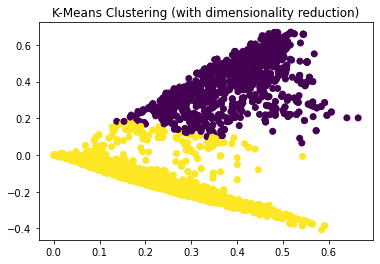

In [59]:
# Convert the list of tokens to strings
def join_tokens(tokens):
    return ' '.join(tokens)

df['Tokenized_Text_String'] = df['Tokenized_Text'].apply(join_tokens)

# Vectorize the tokenized text data using TF-IDF
vectorizer = TfidfVectorizer()
X_text = vectorizer.fit_transform(df['Tokenized_Text_String'])  # Use tokenized text as features

# Reduce dimensionality with Truncated SVD
n_components = 100  # Adjust the number of components as needed
svd = TruncatedSVD(n_components=n_components, random_state=10)
X_text_reduced = svd.fit_transform(X_text)

# Determine the number of clusters (K)
# You can use the Elbow Method to find an optimal K
# For demonstration, let's assume K=2
k = 2

# Fit the K-Means model on reduced text data
kmeans = KMeans(n_clusters=k, random_state=10)
df['Cluster'] = kmeans.fit_predict(X_text_reduced)

# Visualize the clusters
plt.scatter(X_text_reduced[:, 0], X_text_reduced[:, 1], c=df['Cluster'], cmap='viridis')
plt.title("K-Means Clustering (with dimensionality reduction)")
plt.savefig('kmeans_clusters.png')
plt.show()

In [55]:
# Calculate Silhouette Score
silhouette_avg = silhouette_score(X_combined, df['Cluster'])
print(f"K-Means Silhouette Score: {silhouette_avg:.2f}")

db_index = davies_bouldin_score(X_text_reduced, df['Cluster'])
print(f"Davies-Bouldin Index: {db_index:.2f}")

K-Means Silhouette Score: 0.42
Davies-Bouldin Index: 1.79


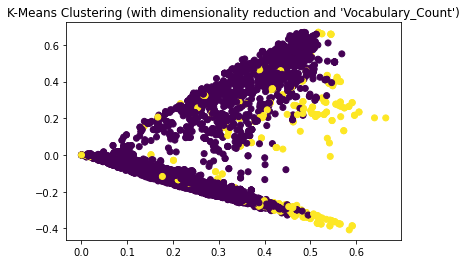

In [17]:


# Convert the list of tokens to strings
def join_tokens(tokens):
    return ' '.join(tokens)

df['Tokenized_Text_String'] = df['Tokenized_Text'].apply(join_tokens)

# Vectorize the tokenized text data using TF-IDF
vectorizer = TfidfVectorizer()
X_text = vectorizer.fit_transform(df['Tokenized_Text_String'])  # Use tokenized text as features

# Reduce dimensionality with Truncated SVD
n_components = 100  # Adjust the number of components as needed
svd = TruncatedSVD(n_components=n_components, random_state=10)
X_text_reduced = svd.fit_transform(X_text)

#  Include the 'Vocabulary_Count' column as a variable
X = df[['Vocabulary_Count']].values  # Use 'Vocabulary_Count' as a feature

#  Combine the reduced text features and 'Vocabulary_Count' feature
X_combined = np.hstack((X_text_reduced, X))

# Determine the number of clusters
k = 2

# Fit the K-Means model on combined data
kmeans = KMeans(n_clusters=k, random_state=10)
df['Cluster'] = kmeans.fit_predict(X_combined)

# Visualize the clusters
plt.scatter(X_combined[:, 0], X_combined[:, 1], c=df['Cluster'], cmap='viridis')
plt.title("K-Means Clustering (with dimensionality reduction and 'Vocabulary_Count')")
plt.show()


In [22]:
#Create a 3D scatter plot
fig = px.scatter_3d(df, x=X_combined[:, 0], y=X_combined[:, 1], z=df['Vocabulary_Count'],
                     color='Cluster', symbol='Spam', opacity=0.7,
                     title="K-Means Clustering (3D Scatter Plot)")
fig.update_traces(marker=dict(size=5))

# Show the plot
fig.show()

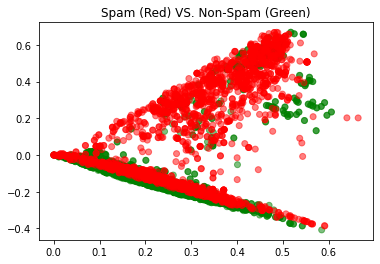

In [61]:
# Convert the list of tokens to strings
def join_tokens(tokens):
    return ' '.join(tokens)

df['Tokenized_Text_String'] = df['Tokenized_Text'].apply(join_tokens)

# Vectorize the tokenized text data using TF-IDF
vectorizer = TfidfVectorizer()
X_text = vectorizer.fit_transform(df['Tokenized_Text_String'])  # Use tokenized text as features

# Reduce dimensionality with Truncated SVD
n_components = 100  # Adjust the number of components as needed
svd = TruncatedSVD(n_components=n_components, random_state=10)
X_text_reduced = svd.fit_transform(X_text)

# Include the 'Vocabulary_Count' column as a variable
X = df[['Vocabulary_Count']].values  # Use 'Vocabulary_Count' as a feature

# Combine the reduced text features and 'Vocabulary_Count' feature
X_combined = np.hstack((X_text_reduced, X))

# Determine the number of clusters 
k = 2

# Fit the K-Means model on combined data
kmeans = KMeans(n_clusters=k, random_state=10)
df['Cluster'] = kmeans.fit_predict(X_combined)

# Create a color map for Spam values (0: green, 1: red)
colors = ['green', 'red']

# Plot the clusters with colors based on Spam value
plt.scatter(
    X_combined[:, 0], X_combined[:, 1], c=[colors[spam] for spam in df['Spam']],
    cmap='viridis', alpha=0.5
)
plt.title("Spam (Red) VS. Non-Spam (Green)")
plt.savefig('spam_vs_ham.png')
plt.show()

In [28]:
# Create a color map for Spam values (0: green, 1: red)
colors = ['green', 'red']

# Create a 3D scatter plot with colors based on Spam value
fig = px.scatter_3d(df, x=X_combined[:, 0], y=X_combined[:, 1], z=df['Vocabulary_Count'],
                     color=df['Spam'], opacity=0.7,
                     title="K-Means Clustering (3D Scatter Plot)")

fig.update_traces(marker=dict(size=5))  # Adjust marker size

# Show the plot
fig.show()


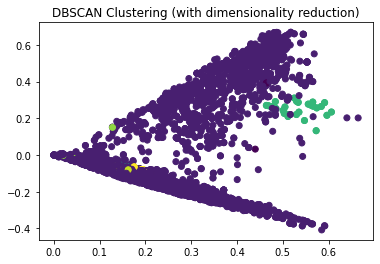

In [56]:
#  Convert the list of tokens to strings
def join_tokens(tokens):
    return ' '.join(tokens)

df['Tokenized_Text_String'] = df['Tokenized_Text'].apply(join_tokens)

# Vectorize the tokenized text data using TF-IDF
vectorizer = TfidfVectorizer()
X_text = vectorizer.fit_transform(df['Tokenized_Text_String'])  # Use tokenized text as features

# Reduce dimensionality with Truncated SVD
n_components = 100  # Adjust the number of components as needed
svd = TruncatedSVD(n_components=n_components, random_state=10)
X_text_reduced = svd.fit_transform(X_text)

# Perform DBSCAN clustering
dbscan = DBSCAN(eps=0.5, min_samples=5)  # Adjust epsilon and min_samples as needed
df['Cluster'] = dbscan.fit_predict(X_text_reduced)

# Visualize the clusters (optional)
plt.scatter(X_text_reduced[:, 0], X_text_reduced[:, 1], c=df['Cluster'], cmap='viridis')
plt.title("DBSCAN Clustering (with dimensionality reduction)")
plt.savefig('DBSCAN_clusters.png')
plt.show()

DBSCAN Davies-Bouldin Index: 0.85


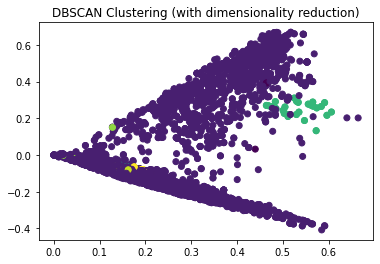

In [53]:
# Calculate Davies-Bouldin Index
db_index_dbscan = davies_bouldin_score(X_text_reduced, df['Cluster'])
print(f"DBSCAN Davies-Bouldin Index: {db_index_dbscan:.2f}")

# Visualize the clusters (optional)
plt.scatter(X_text_reduced[:, 0], X_text_reduced[:, 1], c=df['Cluster'], cmap='viridis')
plt.title("DBSCAN Clustering (with dimensionality reduction)")
plt.show()


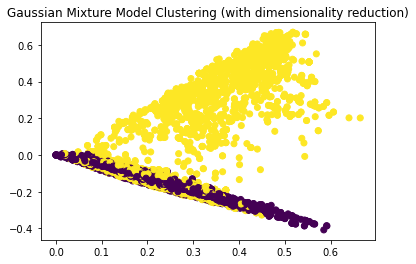

In [62]:
# Reduce dimensionality with Truncated SVD
n_components = 100  # Adjust the number of components as needed
svd = TruncatedSVD(n_components=n_components, random_state=10)
X_text_reduced = svd.fit_transform(X_text)

# Perform Gaussian Mixture Model (GMM) clustering
n_components = 2  # Adjust the number of components as needed
gmm = GaussianMixture(n_components=n_components, random_state=10)
df['Cluster'] = gmm.fit_predict(X_text_reduced)

# Visualize the clusters (optional)
plt.scatter(X_text_reduced[:, 0], X_text_reduced[:, 1], c=df['Cluster'], cmap='viridis')
plt.title("Gaussian Mixture Model Clustering (with dimensionality reduction)")
plt.savefig('GMM.png')
plt.show()

GMM Davies-Bouldin Index: 3.97


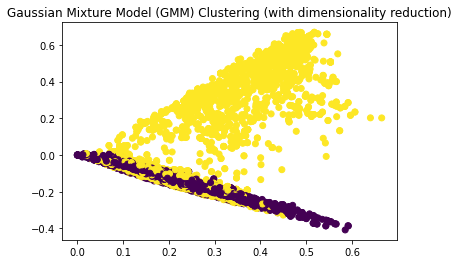

In [51]:
# Assuming you have ground truth labels (true_spam) for evaluation
true_spam = df['Spam']


# Calculate Davies-Bouldin Index
db_index = davies_bouldin_score(X_text_reduced, df['Cluster'])
print(f"GMM Davies-Bouldin Index: {db_index:.2f}")

# Visualize the clusters (optional)
plt.scatter(X_text_reduced[:, 0], X_text_reduced[:, 1], c=df['Cluster'], cmap='viridis')
plt.title("Gaussian Mixture Model (GMM) Clustering (with dimensionality reduction)")
plt.show()
